In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import random
!pip install geohash2
!pip install xlrd
!pip install openpyxl
import geopy
from geopy.distance import geodesic
import time
import shap
import operator
import math
# load JS visualization code to notebook
shap.initjs()
import gc
#plot in a map
import folium
from folium.plugins import MarkerCluster
from folium import Choropleth, Circle, Marker
from folium import plugins
from folium.plugins import HeatMap
# Models
# Algorithmns models to be compared
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier, ExtraTreesClassifier,BaggingClassifier, VotingClassifier, RandomTreesEmbedding
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import RidgeClassifier, SGDClassifier, LogisticRegression
from sklearn.ensemble import RandomForestClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.discriminant_analysis import LinearDiscriminantAnalysis
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.utils import resample
from sklearn.metrics import roc_curve
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.preprocessing import MinMaxScaler
from sklearn.feature_selection import RFE
from sklearn.feature_selection import SelectFromModel
from sklearn.metrics import make_scorer
from lightgbm import LGBMClassifier
import lightgbm as lgb
from sklearn.metrics import fbeta_score
from sklearn.metrics.scorer import make_scorer
from sklearn.model_selection import GridSearchCV, cross_val_score, StratifiedKFold, learning_curve
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
#SIMILARITY IN ORDER TO CLEAN REDUNDANT VALUES
from sklearn.metrics import f1_score
from sklearn.metrics import fbeta_score
import itertools
# Model selection
from sklearn.feature_selection import VarianceThreshold
from sklearn import metrics
from sklearn.preprocessing import RobustScaler
from sklearn.preprocessing import MinMaxScaler
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import SelectFromModel
from sklearn.model_selection import train_test_split
from sklearn.model_selection import StratifiedShuffleSplit, cross_val_score, KFold
from sklearn.model_selection import cross_validate, ShuffleSplit, cross_val_score, GridSearchCV
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, fbeta_score #To evaluate our model
from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import mean_squared_error
from sklearn.metrics import mean_absolute_error
from sklearn.feature_selection import SelectKBest, chi2
from sklearn.metrics import f1_score
from sklearn.metrics import confusion_matrix,accuracy_score,classification_report
from sklearn.metrics import roc_auc_score,roc_curve,scorer
from sklearn.metrics import f1_score
import statsmodels.api as sm
from sklearn.metrics import precision_score,recall_score
import plotly.figure_factory as ff
# Hyperparameter tuning and optimization
from hyperopt import hp, fmin, tpe, Trials, STATUS_OK
from hyperopt.pyll import scope
from sklearn.feature_selection import RFE, RFECV
#plot
import matplotlib.pyplot as plt
import seaborn as sns #Graph library that use matplot in background
# plotly libraries
import cufflinks as cf
cf.go_offline()
import plotly.offline as py 
py.init_notebook_mode(connected=True) # this code, allow us to work with offline plotly version
import plotly.graph_objs as go # it's like "plt" of matplot
# these two lines allow your code to show up in a notebook
from plotly.offline import init_notebook_mode, iplot
init_notebook_mode()
import widgetsnbextension
from IPython.display import display, HTML
# normality tests
from scipy import stats


#display full dataframe
pd.set_option("display.max_rows", None)
pd.set_option("display.max_columns", None)
import warnings
warnings.filterwarnings('ignore')

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

  Created wheel for geohash2: filename=geohash2-1.1-py3-none-any.whl size=15544 sha256=87c9b251757bae3fb73be5037592a6ed24c4708da4cd4c36921d6c10acace9de
  Stored in directory: /root/.cache/pip/wheels/5d/61/e3/c3da255d2fc70eb901623d2e0b690f3da6454d5ef713d288ff
Successfully built geohash2
     |████████████████████████████████| 96 kB 920 kB/s eta 0:00:01
     |████████████████████████████████| 243 kB 843 kB/s eta 0:00:01


The sklearn.metrics.scorer module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.metrics. Anything that cannot be imported from sklearn.metrics is now part of the private API.


/kaggle/input/telco-customer-churn-ibm-dataset/Telco_customer_churn.xlsx


In [2]:
telco = pd.read_excel('/kaggle/input/telco-customer-churn-ibm-dataset/Telco_customer_churn.xlsx')

In [3]:
'''Set a seed for reproducibility'''
seed = 1

'''Set path where all data files are located'''
path = 'C:/Users/Nikitas/Desktop/Nikitas/other_pet_projects/telco/'

'''Create load data function to easy import all necessary'''
def LoadData(path,file):
    """Load Data from defined directory.
    Output is initial data dataframe."""
    data = pd.read_excel(path + file + '.xlsx')
    print ("Data is loaded!")
    print ("Data: ",data.shape[0],"observations, and ",data.shape[1],"features")
    #
    return data

'''Create function for providing summary statistics in a table'''
def resumetable(df):
    print(f"Dataset Shape: {df.shape}")
    summary = pd.DataFrame(df.dtypes,columns=['dtypes'])
    summary = summary.reset_index()
    summary['Name'] = summary['index']
    summary = summary[['Name','dtypes']]
    summary['Missing'] = df.isnull().sum().values    
    summary['Uniques'] = df.nunique().values
    return summary

'''Plot Numeric Features vs target churn in order to assess differences between churners and non churners'''
def TargetvsNumeric(data,numeric,target,numeric_name):


    df1 = data[(data[numeric] >= 0) & 
                                  (data[target] == 'Yes')]
    df2 = data[(data[numeric] >= 0) & 
                                  (data[target] == 'No')]

    #figure size
    title = 'Distribution of ' + numeric_name
    suptitle = numeric_name + ' Distribution'
    xlabel = numeric_name + ' Range'
    plt_title = "Distribution of " + numeric_name + " by Churn"
    plt.figure(figsize=(20,5))

    plt.subplot(121)
    plt.suptitle(suptitle, fontsize=20)
    sns.distplot(data[(data[numeric] >= 0)][numeric], bins=24)
    plt.title(title,fontsize=18)
    plt.xlabel(xlabel,fontsize=15)
    plt.ylabel("Probability",fontsize=15)

    plt.subplot(122)

    sns.distplot(df1[numeric], bins=24, color='r', label='Churned')
    sns.distplot(df2[numeric], bins=24, color='blue', label='Not Churned')
    plt.title(plt_title,fontsize=18)
    plt.xlabel(numeric_name,fontsize=15)
    plt.ylabel("Probability",fontsize=15)
    plt.legend()


    plt.show()

'''Plot Categorical Features vs target churn in order to assess differences between churners and non churners'''

def plot_categoricals(df, col=None, cont = None, binary=None, dodge=True):
    tmp = pd.crosstab(df[col], df[binary], normalize='index') * 100
    tmp = tmp.reset_index()

    plt.figure(figsize=(16,12))

    plt.subplot(221)
    g= sns.countplot(x=col, data=df, order=list(tmp[col].values) , color='green')
    g.set_title(f'{col} Distribution', 
                fontsize=20)
    g.set_xlabel(f'{col} Values',fontsize=17)
    g.set_ylabel('Count Distribution', fontsize=17)
    sizes = []
    for p in g.patches:
        height = p.get_height()
        sizes.append(height)
        g.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.0f}'.format(height),
                ha="center", fontsize=15) 
    g.set_ylim(0,max(sizes)*1.15)

    plt.subplot(222)
    g1= sns.countplot(x=col, data=df, order=list(tmp[col].values),
                     hue=binary,palette="hls")
    g1.set_title(f'{col} Distribution by {binary} ratio %', 
                fontsize=20)
    gt = g1.twinx()
    gt = sns.pointplot(x=col, y='Yes', data=tmp, order=list(tmp[col].values),
                       color='black', legend=False)
    gt.set_ylim(0,tmp['Yes'].max()*1.1)
    gt.set_ylabel("Churned %Ratio", fontsize=16)
    g1.set_ylabel('Count Distribution',fontsize=17)
    g1.set_xlabel(f'{col} Values', fontsize=17)
    
    sizes = []
    
    for p in g1.patches:
        height = p.get_height()
        sizes.append(height)
        g1.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center", fontsize=10) 
    g1.set_ylim(0,max(sizes)*1.15)

    plt.subplot(212)
    g2= sns.swarmplot(x=col, y=cont, data=df, dodge=dodge, order=list(tmp[col].values),
                     hue=binary,palette="hls")
    g2.set_title(f'{cont} Distribution by {col} and {binary}', 
                fontsize=20)
    g2.set_ylabel(f'{cont} Distribution',fontsize=17)
    g2.set_xlabel(f'{col} Values', fontsize=17)


    plt.suptitle(f'{col} Distributions', fontsize=22)
    plt.subplots_adjust(hspace = 0.4, top = 0.90)
    
    plt.show()

'''Plot categories distribution ratio along with percentage of monthly charges by category. This way it can be identified which category results into higher loss in revenue'''
    
def PlotDistRatio(df, col, lim=200):
    tmp = pd.crosstab(df[col], df['Churn Value'], normalize='index') * 100
    tmp = tmp.reset_index()
    tmp.rename(columns={0:'NoChurn', 1:'Churn'}, inplace=True)

    plt.figure(figsize=(20,5))
    plt.suptitle(f'{col} Distributions ', fontsize=22)

    plt.subplot(121)
    g = sns.countplot(x=col, data=df, order=list(tmp[col].values))
    # plt.legend(title='Fraud', loc='upper center', labels=['No', 'Yes'])
    g.set_title(f"{col} Distribution\nCount and %Churn by each category", fontsize=18)
    g.set_ylim(0,4000)
    gt = g.twinx()
    gt = sns.pointplot(x=col, y='Churn', data=tmp, order=list(tmp[col].values),
                       color='black', legend=False, )
    gt.set_ylim(0,80)
    gt.set_ylabel("% of Churn", fontsize=16)
    g.set_xlabel(f"{col} Category Names", fontsize=16)
    g.set_ylabel("Count", fontsize=17)
    for p in gt.patches:
        height = p.get_height()
        gt.text(p.get_x()+p.get_width()/2.,
                height + 3,
                '{:1.2f}%'.format(height/total*100),
                ha="center",fontsize=14) 
    total_amt = df.groupby(['Churn Value'])['Monthly Charges'].sum()   
    perc_amt = (df.groupby(['Churn Value',col])['Monthly Charges'].sum() / total_amt * 100).unstack('Churn Value')
    perc_amt = perc_amt.reset_index()
    perc_amt.rename(columns={0:'NoChurn', 1:'Churn'}, inplace=True)

    plt.subplot(122)
    g1 = sns.boxplot(x=col, y='Monthly Charges', hue='Churn Value', 
                     data=df[df['Monthly Charges'] <= lim], order=list(tmp[col].values))
    g1t = g1.twinx()
    g1t = sns.pointplot(x=col, y='Churn', data=perc_amt, order=list(tmp[col].values),
                       color='black', legend=False, )
    g1t.set_ylim(0,100)
    g1t.set_ylabel("%Churn Total Monthly Charges", fontsize=16)
    g1.set_title(f"{col} by Monthly Charges", fontsize=18)
    g1.set_xlabel(f"{col} Category Names", fontsize=16)
    g1.set_ylabel("Monthly Charges($)", fontsize=16)
        
    plt.subplots_adjust(hspace=.4, wspace = 0.35, top = 0.80)
    
    plt.show()    
    
    
    
    
    
'''Plot customers in the map to check density of customers in the map'''

def PlotLocations(data):
    data['Latitude'] = data['Latitude'].astype(float)
    data['Longitude'] = data['Longitude'].astype(float)
    # Create the map
    m_3 = folium.Map(location=[33.964131,-118.272783], tiles='cartodbpositron', zoom_start=13)

    # Add points to the map
    mc = MarkerCluster()
    for idx, row in data.iterrows():
        if not math.isnan(row['Longitude']) and not math.isnan(row['Latitude']):
            mc.add_child(Marker([row['Latitude'], row['Longitude']]))
    m_3.add_child(mc)


    data_churn = data[data['Churn Label'] == 'Yes']


    data_churn = data_churn[['Latitude', 'Longitude']]
    data_churn = data_churn.dropna(axis=0, subset=['Latitude','Longitude'])

    # List comprehension to make out list of lists
    heat_data = [[row['Latitude'],row['Longitude']] for index, row in data_churn.iterrows()]

    # Plot it on the map
    HeatMap(heat_data).add_to(m_3)

    # Display the map
    return m_3


'''Calculate distance between two given locations with lat long coordinates'''
def calculate_distance(location, set_coord):
    """ take two tuples of latitude and longitude and
    calculate distance in km"""
    locations = []

    distance = geodesic(location, set_coord)
    locations.append([distance.kilometers])
    df = pd.DataFrame(locations, columns=['Distance'])
    
    return df['Distance'][0]


'''Feature Engineer extra variables ready for ML fit'''

def FEngineering(df):
    df = df.copy()
    cols_binary = ['Online Security','Online Backup','Device Protection','Tech Support',
              'Streaming TV','Streaming Movies','Phone Service','Multiple Lines',
              'Senior Citizen','Partner','Dependents','Paperless Billing']
    for col in cols_binary:

        df[col] = np.where((df[col] == 'Yes'), 1,0)
    #create binary if it is not month to month    
    df['Engaged'] = np.where(df['Contract'] != 'Month-to-month', 1,0)
    #male binary var    
    df['Male'] = np.where((df['Gender'] == 'Male'), 1,0)
    df['No internet service' + ' ohe'] = np.where((df['Online Security'] == 'No internet service'), 1,0)
    # create one hot encoding for special cases in floor feature
    special_cases_contract = ['Month-to-month', 'One year', 'Two year']
    #
    for case in special_cases_contract:
        df[case + ' ohe'] = np.where((df['Contract'] == case), 1,0)

    # create one hot encoding for special cases for every feature
    special_payment_method = ['Mailed check', 'Electronic check', 'Bank transfer (automatic)','Credit card (automatic)']
    #
    for case in special_payment_method:
        df[case + ' ohe'] = np.where((df['Payment Method'] == case), 1,0)

    # create one hot encoding for special cases for every feature
    special_internet_service = ['Fiber optic', 'DSL']

    for case in special_internet_service:
        df[case + ' ohe'] = np.where((df['Internet Service'] == case), 1,0)
        
        
    df['No Protection'] = np.where((df['Online Backup'] != 'Yes') |\
                                    (df['Device Protection'] != 'Yes') |\
                                    (df['Tech Support'] != 'Yes'), 1,0)

    df['Total Services'] = (df[['Online Security','Online Backup','Device Protection','Tech Support',
              'Streaming TV','Streaming Movies','Phone Service','Multiple Lines','Paperless Billing']]== 'Yes').sum(axis=1)
    
    
    #calculate dinstances
    
    san_francisco = (37.773972, -122.431297)
    los_angeles = (34.052235, -118.243683)
    san_diego = (32.715736, -117.161087)
    sacramento = (38.575764, -121.478851)
    # calculate distance features
    df['san_francisco_distance'] = df.apply(lambda x: calculate_distance((x['Latitude'],x['Longitude']),san_francisco), axis = 1)
    df['los_angeles_distance'] = df.apply(lambda x: calculate_distance((x['Latitude'],x['Longitude']),los_angeles), axis = 1)
    df['san_diego_distance'] = df.apply(lambda x: calculate_distance((x['Latitude'],x['Longitude']),san_diego), axis = 1)
    df['sacramento_distance'] = df.apply(lambda x: calculate_distance((x['Latitude'],x['Longitude']),sacramento), axis = 1)
    
    
    #keep certain columns
    df = df[['CustomerID','Churn Value',
    'Tenure Months','Monthly Charges','CLTV', 'Engaged', 'Male',
       'No internet service ohe', 'Month-to-month ohe', 'One year ohe',
       'Two year ohe', 'Mailed check ohe', 'Electronic check ohe',
       'Bank transfer (automatic) ohe', 'Credit card (automatic) ohe',
       'Fiber optic ohe', 'DSL ohe', 'No Protection', 'Total Services',
       'san_francisco_distance', 'los_angeles_distance', 'san_diego_distance',
       'sacramento_distance','Online Security','Online Backup','Device Protection','Tech Support',
              'Streaming TV','Streaming Movies','Phone Service','Multiple Lines',
              'Senior Citizen','Partner','Dependents','Paperless Billing']].drop_duplicates()
    print ("Data is transformed!")
    print ("Data: ",df.shape[0],"observations, and ",df.shape[1],"features")

    return df


def remove_collinear_features(x, threshold):
    '''
    Objective:
        Remove collinear features in a dataframe with a correlation coefficient
        greater than the threshold. Removing collinear features can help a model 
        to generalize and improves the interpretability of the model.

    Inputs: 
        x: features dataframe
        threshold: features with correlations greater than this value are removed

    Output: 
        dataframe that contains only the non-highly-collinear features
    '''

    # Calculate the correlation matrix
    corr_matrix = x.corr()
    iters = range(len(corr_matrix.columns) - 1)
    drop_cols = []

    # Iterate through the correlation matrix and compare correlations
    for i in iters:
        for j in range(i+1):
            item = corr_matrix.iloc[j:(j+1), (i+1):(i+2)]
            col = item.columns
            row = item.index
            val = abs(item.values)

            # If correlation exceeds the threshold
            if val >= threshold:
                # Print the correlated features and the correlation value
                #print(col.values[0], "|", row.values[0], "|", round(val[0][0], 2))
                drop_cols.append(col.values[0])

    # Drop one of each pair of correlated columns
    drops = set(drop_cols)
    x = x.drop(columns=drops)
    print('Removed Columns {}'.format(drops))
    return x



#dataframe from upper step and number of best variables to output
def variableselection(df,best,target,features_to_select,rand):

        start = time.time()

        #Creating the X and y variables

        def XyCreation(df):
               y = df[target].ravel()
               y = np.array(y).astype(int)
               X = pd.DataFrame(df.drop([target,'CustomerID'], axis=1))
               x_train, x_test, y_train, y_test = train_test_split(X, y,test_size = 0.1, random_state=rand, stratify=y)
               return x_train,y_train

    
        X,y = XyCreation(df)

 # =============================================================================
 #        #Remove missing
 # =============================================================================
        print('Remove Missing..')
        for col in X.columns:
               if X[col].isnull().sum()/X.shape[0] > 0.9:
                      print(col)
                      del X[col]
 # =============================================================================
 #        #Remove low variance features
 # =============================================================================       
        for col in X.columns:
               if X[col].nunique()==1:
                      print(col)
                      del X[col]
 # =============================================================================
 #        #Pearson Correlation
 # =============================================================================
        print('Pearson Correlation..')

        def cor_selector(X, y):
            cor_list = []
            # calculate the correlation with y for each feature
            for i in X.columns.tolist():
                cor = np.corrcoef(X[i], y)[0, 1]
                cor_list.append(cor)
            # replace NaN with 0
            cor_list = [0 if np.isnan(i) else i for i in cor_list]
            # feature name
            cor_feature = X.iloc[:,np.argsort(np.abs(cor_list))[-features_to_select:]].columns.tolist()
            # feature selection? 0 for not select, 1 for select
            cor_support = [True if i in cor_feature else False for i in feature_name]
            return cor_support, cor_feature


        feature_name = X.columns.tolist()     

        cor_support, cor_feature = cor_selector(X, y)

 # =============================================================================
 #        #Chi-2
 # =============================================================================
        print('Chi-2..')

        X_norm = MinMaxScaler().fit_transform(X)
        chi_selector = SelectKBest(chi2, k=features_to_select)
        chi_selector.fit(X_norm, y)

        chi_support = chi_selector.get_support()
        chi_feature = X.loc[:,chi_support].columns.tolist()
        print(str(len(chi_feature)), 'selected features')


 # =============================================================================
 #        #Wrapper RFE selector
 # =============================================================================
        print('RFE selector..')
        rfe_selector = RFE(estimator=LogisticRegression(class_weight = 'balanced'), n_features_to_select=features_to_select, step=150, verbose=5)
        rfe_selector.fit(X_norm, y)

        rfe_support = rfe_selector.get_support()
        rfe_feature = X.loc[:,rfe_support].columns.tolist()
        print(str(len(rfe_feature)), 'selected features')

 # =============================================================================
 #        #Embedded
 # =============================================================================

        print('LogisticRegression l2 ..')

        embeded_lr_selector = SelectFromModel(LogisticRegression(penalty="l2",class_weight = 'balanced'))
        embeded_lr_selector.fit(X_norm, y)

        embeded_lr_support = embeded_lr_selector.get_support()
        embeded_lr_feature = X.loc[:,embeded_lr_support].columns.tolist()
        print(str(len(embeded_lr_feature)), 'selected features')
 # =============================================================================
 #        #Random Forest
 # =============================================================================
        print('Random Forest ..')

        embeded_rf_selector = SelectFromModel(RandomForestClassifier(n_estimators=features_to_select,class_weight = 'balanced'))
        embeded_rf_selector.fit(X, y)

        embeded_rf_support = embeded_rf_selector.get_support()
        embeded_rf_feature = X.loc[:,embeded_rf_support].columns.tolist()
        print(str(len(embeded_rf_feature)), 'selected features')

 # =============================================================================
 #        #Light GBM
 # =============================================================================
        print('Light GBM ..')


        lgbc=LGBMClassifier(n_estimators=features_to_select, class_weight = 'balanced',learning_rate=0.05, num_leaves=32, colsample_bytree=0.2,
                    reg_alpha=3, reg_lambda=1, min_split_gain=0.01, min_child_weight=40)

        embeded_lgb_selector = SelectFromModel(lgbc)
        embeded_lgb_selector.fit(X, y)

        embeded_lgb_support = embeded_lgb_selector.get_support()
        embeded_lgb_feature = X.loc[:,embeded_lgb_support].columns.tolist()
        print(str(len(embeded_lgb_feature)), 'selected features')




        pd.set_option('display.max_rows', None)
        # put all selection together
        feature_selection_df = pd.DataFrame({'Feature':feature_name, 'Pearson':cor_support, 'Chi-2':chi_support, 'RFE':rfe_support, 'Logistics':embeded_lr_support,
                                            'Random Forest':embeded_rf_support, 'LightGBM':embeded_lgb_support})
        # count the selected times for each feature
        feature_selection_df['Total'] = np.sum(feature_selection_df, axis=1)
        # display the top x
        feature_selection_df = feature_selection_df.sort_values(['Total','Feature'] , ascending=False)
        feature_selection_df.index = range(1, len(feature_selection_df)+1)

        best_features = feature_selection_df.head(best)
        best_features = list(best_features['Feature'])
        print(best_features)
        Xbest = X[best_features]

        # remove uncorrelated features 
        Xbest = remove_collinear_features(Xbest,0.9)
        

        end = time.time()
        print((end - start)/60)

        return Xbest
    
    
'''Convert main dataframe to train test split ready to train/validate model'''
def ModelCreation(df,testsize,target,selected_features,rand):
    """
    Return 4 dataframes for train and test
    param df:
        dataframe to split into train test
    return:
        return 4 frames
    """
    #set x and y
    y=df[target].values
    x=df.drop([target,'CustomerID'], axis=1)
    x= x[selected_features]
    # train test split
    x_train, x_test, y_train, y_test = train_test_split(x, y,test_size = testsize, random_state=rand, stratify=y)

    
    return x_train, x_test, y_train, y_test


def plot_confusion_matrix(y_true, y_pred,normalize=False,title = None,cmap=plt.cm.Blues):


        """
        This function prints and plots the confusion matrix.
        Normalization can be applied by setting `normalize=True`.
        """
        if not title:
            if normalize:
                title = 'Normalized confusion matrix'
            else:
                title = 'Confusion matrix, without normalization'

        # Compute confusion matrix
        cm = confusion_matrix(y_true, y_pred)

        if normalize:
            cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
            print("Normalized confusion matrix")
        else:
            print('Confusion matrix, without normalization')

        print(cm)

        fig, ax = plt.subplots()
        im = ax.imshow(cm, interpolation='nearest', cmap=cmap)
        ax.figure.colorbar(im, ax=ax)
        # We want to show all ticks...
        ax.set(xticks=[],
               yticks=[],
               # ... and label them with the respective list entries
               #xticklabels=classes, yticklabels=classes,
               title=title,
               ylabel='True label',
               xlabel='Predicted label')

        # Rotate the tick labels and set their alignment.
        plt.setp(ax.get_xticklabels(), rotation=45, ha="right",
                 rotation_mode="anchor")


        # Loop over data dimensions and create text annotations.
        fmt = '.2f' if normalize else 'd'
        thresh = cm.max() / 2.
        for i in range(cm.shape[0]):
            for j in range(cm.shape[1]):
                ax.text(j, i, format(cm[i, j], fmt),
                        ha="center", va="center",
                        color="white" if cm[i, j] > thresh else "black")
        fig.tight_layout()
        return ax
    
    
def plotscoreclf(x,y,clf):
                     
        #Predict on test set
        #Predicting proba
        predictions_clf_prob = clf.predict(x)
        predictions_clf_01 = np.where(predictions_clf_prob > 0.5, 1, 0) #Turn probability to 0-1 binary output


        print("accuracy is:", accuracy_score(y,predictions_clf_01))
        print("\n")
        print("confusion matrix is:", confusion_matrix(y, predictions_clf_01))
        print("\n")
        print("fbeta is:", fbeta_score(y, predictions_clf_01, beta=2))
        print("\n")
        print(classification_report(y, predictions_clf_01))

        # Generate ROC curve values: fpr, tpr, thresholds
        fpr, tpr, thresholds = roc_curve(y, predictions_clf_prob)

        # Plot ROC curve
        plt.plot([0, 1], [0, 1], 'k--')
        plt.plot(fpr, tpr)
        plt.xlabel('False Positive Rate')
        plt.ylabel('True Positive Rate')
        plt.title('ROC Curve')
        plt.show()

        # Plot non-normalized confusion matrix
        plot_confusion_matrix(y, predictions_clf_01,
                              title='Confusion matrix, without normalization')

        # Plot normalized confusion matrix
        plot_confusion_matrix(y, predictions_clf_01, normalize=True,
                              title='Normalized confusion matrix')

        plt.show()

### Telco Churn Customers analysis and Prediction

### Description of dataset
***
#### Context
***
Identify which features lead to churn - create a pipeline to select an optimal model able to generalize well in unseen data - create a procedure that can explain model's decision for every customer
***
#### Content
***

#### The data set includes information about:
- __Customers who left within the last month__ – the column is called Churn(target variable)
- __Services that each customer has signed up for__ – phone, multiple lines, internet, online security, online backup, device protection, tech support, and streaming TV and movies
- __Customer account information__ – how long they’ve been a customer, contract, payment method, paperless billing, monthly charges, and total charges
- __Demographics__ – gender, age range, and if they have partners and dependents
- __Location related information__ – Country,State,Lat-Long coordinates

***
__link__: __https://community.ibm.com/community/user/businessanalytics/blogs/steven-macko/2019/07/11/telco-customer-churn-1113__
***

### Objectives:

***
Explore the data and try to answer some questions like:
***

- What's the % of Churn Customers and customers that keep in with the active services.
- We can see different patterns in Churn Customers based on the type of service provided?
- Get advantage of lat/long coordinates and obtain useful features to predict churn.
- We have difference pattern of churn between genders ?
- What's the difference between customers that pay monthly and by year?
-what's the most profitable service types?
- What's the amount lose in revenue?
- What's the mean age of papeless customers? they are more propense to churn?
- A lot of other questions that will raise trought the exploration

### Motivation

- @kabure and his amazing notebook https://www.kaggle.com/kabure/insightful-eda-churn-customers-models-pipeline has been a great source of ideas to start a notebook of my own and try to expand with my approach.
- https://www.kaggle.com/ridhoaryo/telco-churn-analysis-and-modeling has been also a great source of inspiration.

I will build a pipeline to find a model that better fits our data. With the best models I will predict the result and verify the scores of the models.

### Dictionary

***
__Demographics__
***

CustomerID: A unique ID that identifies each customer.

Count: A value used in reporting/dashboarding to sum up the number of customers in a filtered set.

Gender: The customer’s gender: Male, Female

Senior Citizen: Indicates if the customer is 65 or older: Yes, No

Partner: Indicates if the customer has a partner: Yes,No

Dependents: Indicates if the customer lives with any dependents: Yes, No. Dependents could be children, parents, grandparents, etc.



***
__Location__
***
Country: The country of the customer’s primary residence.

State: The state of the customer’s primary residence.

City: The city of the customer’s primary residence.

Zip Code: The zip code of the customer’s primary residence.

Lat Long: The combined latitude and longitude of the customer’s primary residence.

Latitude: The latitude of the customer’s primary residence.

Longitude: The longitude of the customer’s primary residence.



***
__Services__
***

Tenure Months: Indicates the total amount of months that the customer has been with the company by the end of the quarter specified above.

Multiple Lines: Indicates if the customer subscribes to multiple telephone lines with the company: Yes, No

Internet Service: Indicates if the customer subscribes to Internet service with the company: No, DSL, Fiber Optic, Cable.

Online Security: Indicates if the customer subscribes to an additional online security service provided by the company: Yes, No

Online Backup: Indicates if the customer subscribes to an additional online backup service provided by the company: Yes, No

Device Protection: Indicates if the customer subscribes to an additional device protection plan for their Internet equipment provided by the company: Yes, No

Tech Support: Indicates if the customer subscribes to an additional technical support plan from the company with reduced wait times: Yes, No

Streaming TV: Indicates if the customer uses their Internet service to stream television programing from a third party provider: Yes, No. The company does not charge an additional fee for this service.

Streaming Movies: Indicates if the customer uses their Internet service to stream movies from a third party provider: Yes, No. The company does not charge an additional fee for this service.

Streaming Music: Indicates if the customer uses their Internet service to stream music from a third party provider: Yes, No. The company does not charge an additional fee for this service.

Contract: Indicates the customer’s current contract type: Month-to-Month, One Year, Two Year.

Paperless Billing: Indicates if the customer has chosen paperless billing: Yes, No

Payment Method: Indicates how the customer pays their bill: Bank Withdrawal, Credit Card, Mailed Check

Monthly Charge: Indicates the customer’s current total monthly charge for all their services from the company.

Total Charges: Indicates the customer’s total charges, calculated to the end of the quarter specified above.



***
__Status__
***

Churn Label: Yes = the customer left the company this quarter. No = the customer remained with the company. Directly related to Churn Value.

Churn Value: 1 = the customer left the company this quarter. 0 = the customer remained with the company. Directly related to Churn Label.

Churn Score: A value from 0-100 that is calculated using the predictive tool IBM SPSS Modeler. The model incorporates multiple factors known to cause churn. The higher the score, the more likely the customer will churn.

CLTV: Customer Lifetime Value. A predicted CLTV is calculated using corporate formulas and existing data. The higher the value, the more valuable the customer. High value customers should be monitored for churn.

Churn Reason: A customer’s specific reason for leaving the company. Directly related to Churn Category.

In [4]:
#Load data
path = '/kaggle/input/telco-customer-churn-ibm-dataset/'
data = LoadData(path,'Telco_customer_churn')

Data is loaded!
Data:  7043 observations, and  33 features


In [5]:
data.head()

,CustomerID,Count,Country,State,City,Zip Code,Lat Long,Latitude,Longitude,Gender,Senior Citizen,Partner,Dependents,Tenure Months,Phone Service,Multiple Lines,Internet Service,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Contract,Paperless Billing,Payment Method,Monthly Charges,Total Charges,Churn Label,Churn Value,Churn Score,CLTV,Churn Reason
0,3668-QPYBK,1,United States,California,Los Angeles,90003,"33.964131, -118.272783",33.964131,-118.272783,Male,No,No,No,2,Yes,No,DSL,Yes,Yes,No,No,No,No,Month-to-month,Yes,Mailed check,53.85,108.15,Yes,1,86,3239,Competitor made better offer
1,9237-HQITU,1,United States,California,Los Angeles,90005,"34.059281, -118.30742",34.059281,-118.307420,Female,No,No,Yes,2,Yes,No,Fiber optic,No,No,No,No,No,No,Month-to-month,Yes,Electronic check,70.70,151.65,Yes,1,67,2701,Moved
2,9305-CDSKC,1,United States,California,Los Angeles,90006,"34.048013, -118.293953",34.048013,-118.293953,Female,No,No,Yes,8,Yes,Yes,Fiber optic,No,No,Yes,No,Yes,Yes,Month-to-month,Yes,Electronic check,99.65,820.5,Yes,1,86,5372,Moved
3,7892-POOKP,1,United States,California,Los Angeles,90010,"34.062125, -118.315709",34.062125,-118.315709,Female,No,Yes,Yes,28,Yes,Yes,Fiber optic,No,No,Yes,Yes,Yes,Yes,Month-to-month,Yes,Electronic check,104.80,3046.05,Yes,1,84,5003,Moved
4,0280-XJGEX,1,United States,California,Los Angeles,90015,"34.039224, -118.266293",34.039224,-118.266293,Male,No,No,Yes,49,Yes,Yes,Fiber optic,No,Yes,Yes,No,Yes,Yes,Month-to-month,Yes,Bank transfer (automatic),103.70,5036.3,Yes,1,89,5340,Competitor had better devices


In [6]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 7043 entries, 0 to 7042
Data columns (total 33 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   CustomerID         7043 non-null   object 
 1   Count              7043 non-null   int64  
 2   Country            7043 non-null   object 
 3   State              7043 non-null   object 
 4   City               7043 non-null   object 
 5   Zip Code           7043 non-null   int64  
 6   Lat Long           7043 non-null   object 
 7   Latitude           7043 non-null   float64
 8   Longitude          7043 non-null   float64
 9   Gender             7043 non-null   object 
 10  Senior Citizen     7043 non-null   object 
 11  Partner            7043 non-null   object 
 12  Dependents         7043 non-null   object 
 13  Tenure Months      7043 non-null   int64  
 14  Phone Service      7043 non-null   object 
 15  Multiple Lines     7043 non-null   object 
 16  Internet Service   7043 

In [7]:
data.describe()

,Count,Zip Code,Latitude,Longitude,Tenure Months,Monthly Charges,Churn Value,Churn Score,CLTV
count,7043.0,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000,7043.000000
mean,1.0,93521.964646,36.282441,-119.798880,32.371149,64.761692,0.265370,58.699418,4400.295755
std,0.0,1865.794555,2.455723,2.157889,24.559481,30.090047,0.441561,21.525131,1183.057152
min,1.0,90001.000000,32.555828,-124.301372,0.000000,18.250000,0.000000,5.000000,2003.000000
25%,1.0,92102.000000,34.030915,-121.815412,9.000000,35.500000,0.000000,40.000000,3469.000000
50%,1.0,93552.000000,36.391777,-119.730885,29.000000,70.350000,0.000000,61.000000,4527.000000
75%,1.0,95351.000000,38.224869,-118.043237,55.000000,89.850000,1.000000,75.000000,5380.500000
max,1.0,96161.000000,41.962127,-114.192901,72.000000,118.750000,1.000000,100.000000,6500.000000


In [8]:
resumetable(data)

Dataset Shape: (7043, 33)


,Name,dtypes,Missing,Uniques
0,CustomerID,object,0,7043
1,Count,int64,0,1
2,Country,object,0,1
3,State,object,0,1
4,City,object,0,1129
5,Zip Code,int64,0,1652
6,Lat Long,object,0,1652
7,Latitude,float64,0,1652
8,Longitude,float64,0,1651
9,Gender,object,0,2


__Notes__

1. We can see that we have one entry for each **CustomerID** (7.043)
2. The dataset don't have missing values except **Churn Reason** feature
3. Most of features are categorical
4. The target the we will use to guide the exploration is **Churn**

#### Churn Distribution

Lets check target distribution

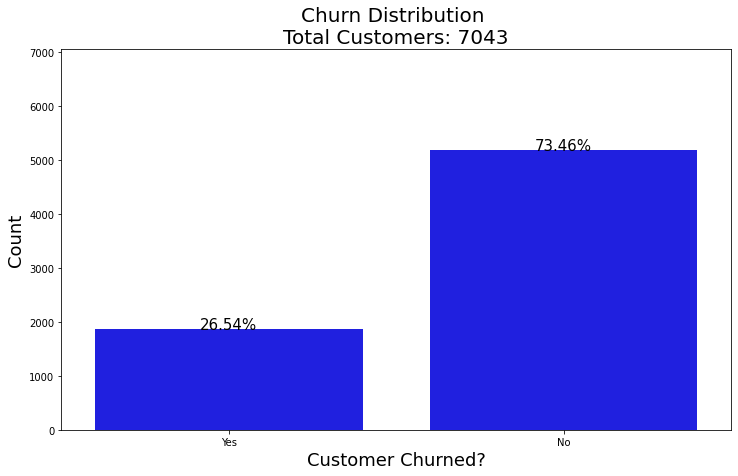

In [9]:
total = len(data)
plt.figure(figsize=(12,7))

g = sns.countplot(x='Churn Label', data=data, color='blue')
g.set_title(f"Churn Distribution \nTotal Customers: {total}", 
            fontsize=20)
g.set_xlabel("Customer Churned?", fontsize=18)
g.set_ylabel('Count', fontsize=18)
for p in g.patches:
    height = p.get_height()
    g.text(p.get_x()+p.get_width()/2.,
            height + 4,
            '{:1.2f}%'.format(height/total*100),
            ha="center", fontsize=15) 
g.set_ylim(0, total *1.00)

plt.show()

__26.5%__ of customers have churned in our dataset. We will attempt to understand the underlying reasons which lead to churn and eventually can make us proactively identify those customers.

### Plot numerical features vs churn

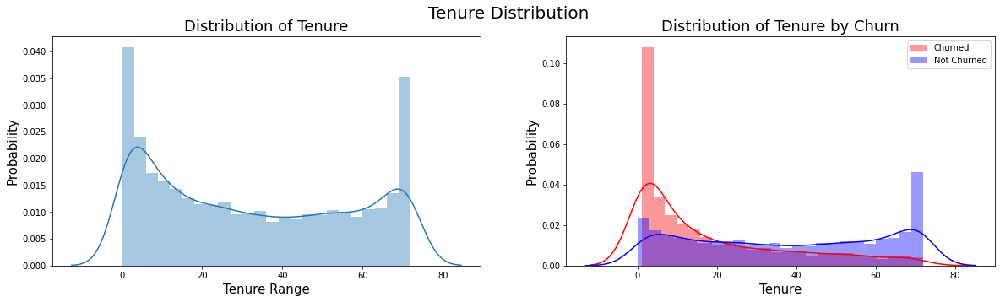

In [10]:
TargetvsNumeric(data,"Tenure Months","Churn Label","Tenure")

Interesting finding is that older customers are less likely to churn. Seems that customer loyalty plays an important role in churn decision.

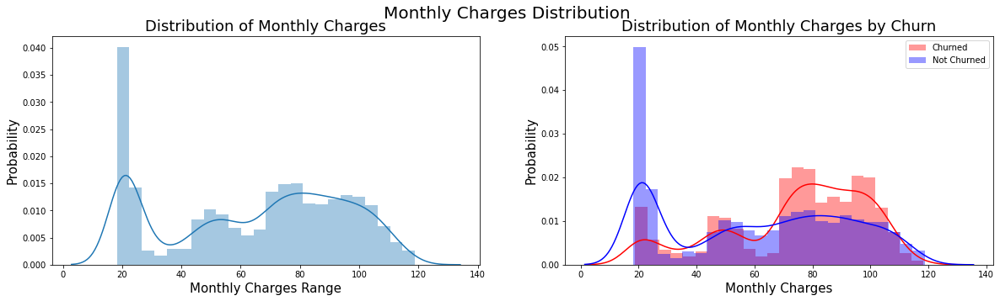

In [11]:
TargetvsNumeric(data,"Monthly Charges","Churn Label","Monthly Charges")

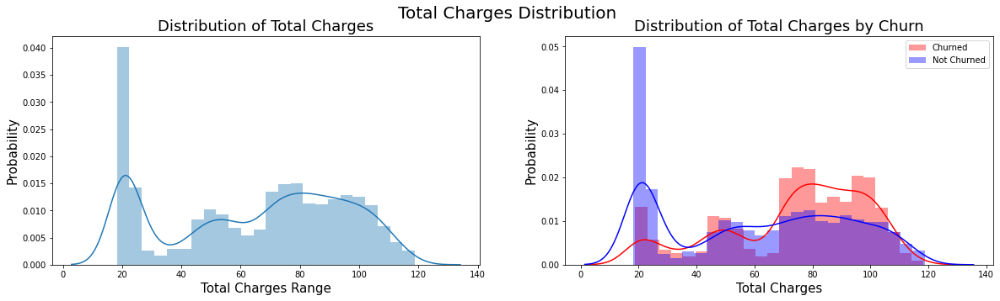

In [12]:
TargetvsNumeric(data,"Monthly Charges","Churn Label","Total Charges")

Customers with higher Monthly and Total Charges are also more likely to churn

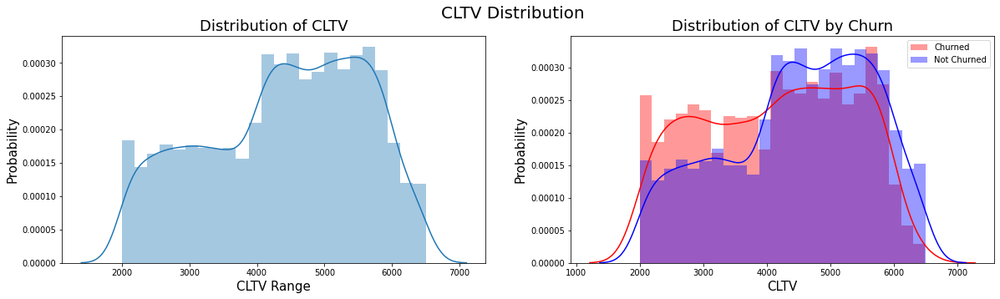

In [13]:
TargetvsNumeric(data,"CLTV","Churn Label","CLTV")

Customers with higher Lifetime Value are less likely to churn

### Plot categorical features vs churn

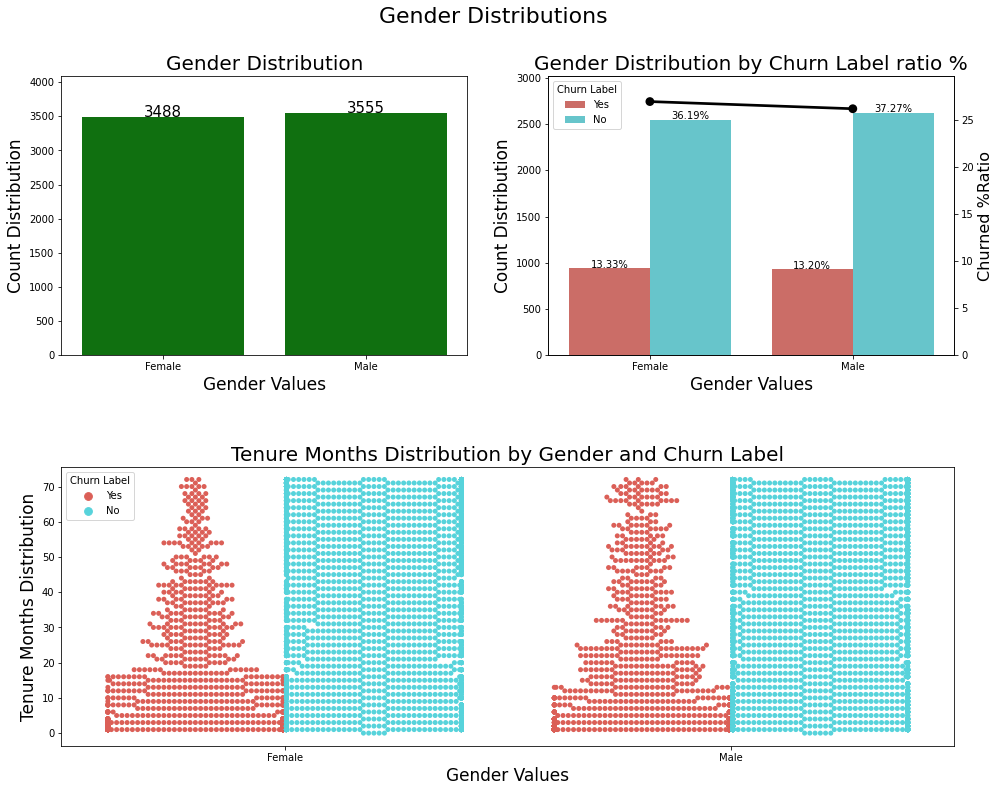

In [14]:
plot_categoricals(data, col="Gender", cont = "Tenure Months", binary="Churn Label", dodge=True)

There is no significant effect between gender for customer churn

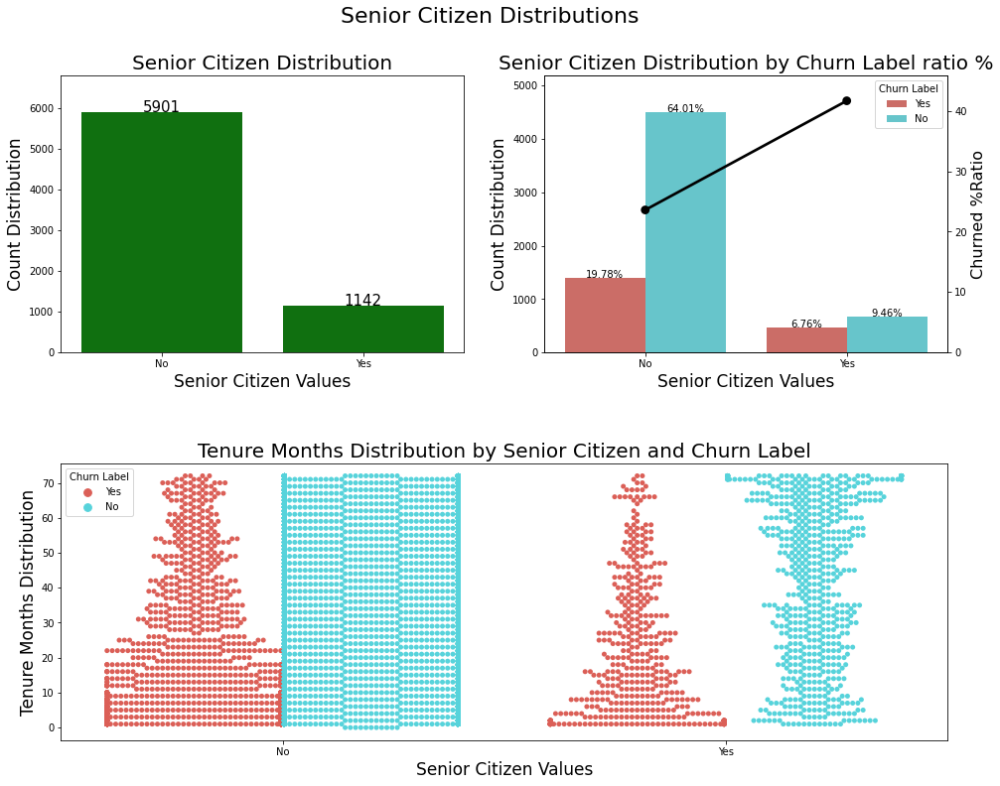

In [15]:
plot_categoricals(data, col="Senior Citizen", cont = "Tenure Months", binary="Churn Label", dodge=True)

Senior customers (>65 years old) have a higher tendecy to churn compared to non senior ones

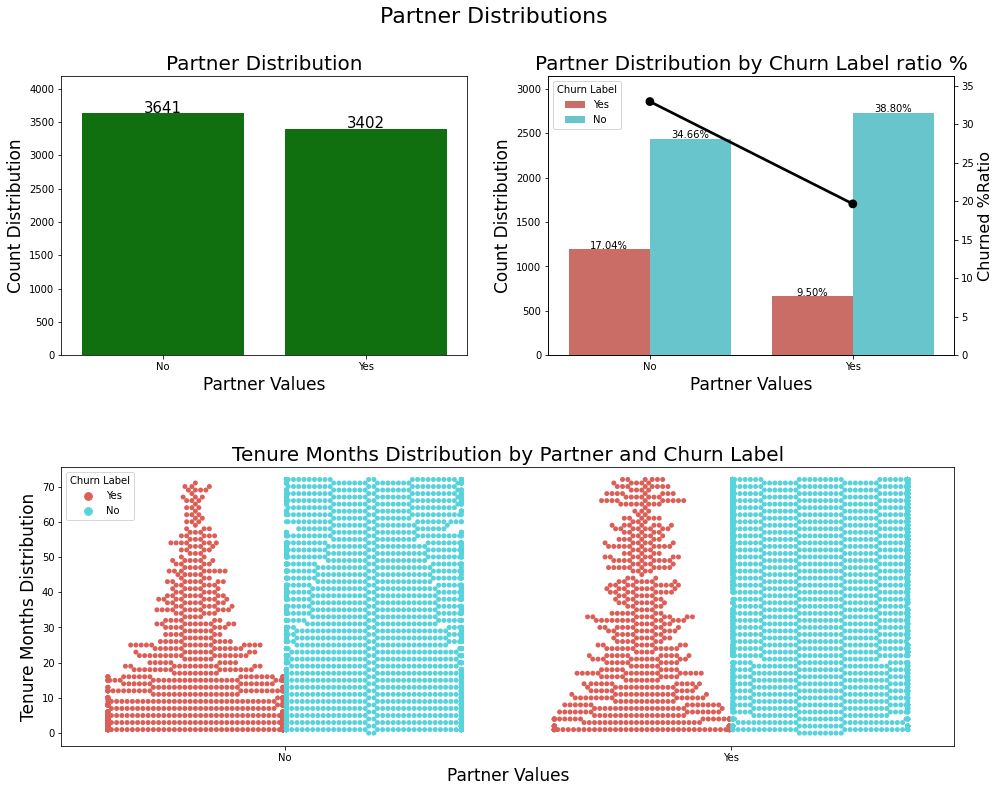

In [16]:
plot_categoricals(data, col="Partner", cont = "Tenure Months", binary="Churn Label", dodge=True)

Customers with a partner are less likely to churn compared to customers with no partner (20% -> 34%)

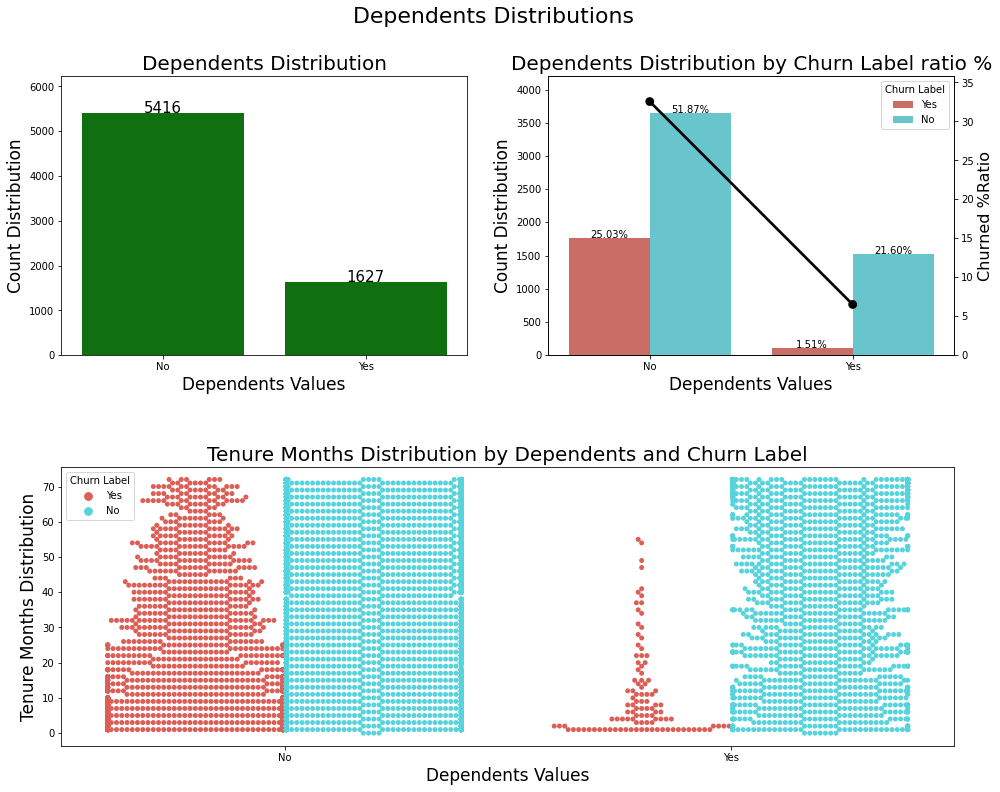

In [17]:
plot_categoricals(data, col="Dependents", cont = "Tenure Months", binary="Churn Label", dodge=True)

Customers with __dependent__ family members are significantly less likely to churn compared with customers with no dependents (5% -> 33%)

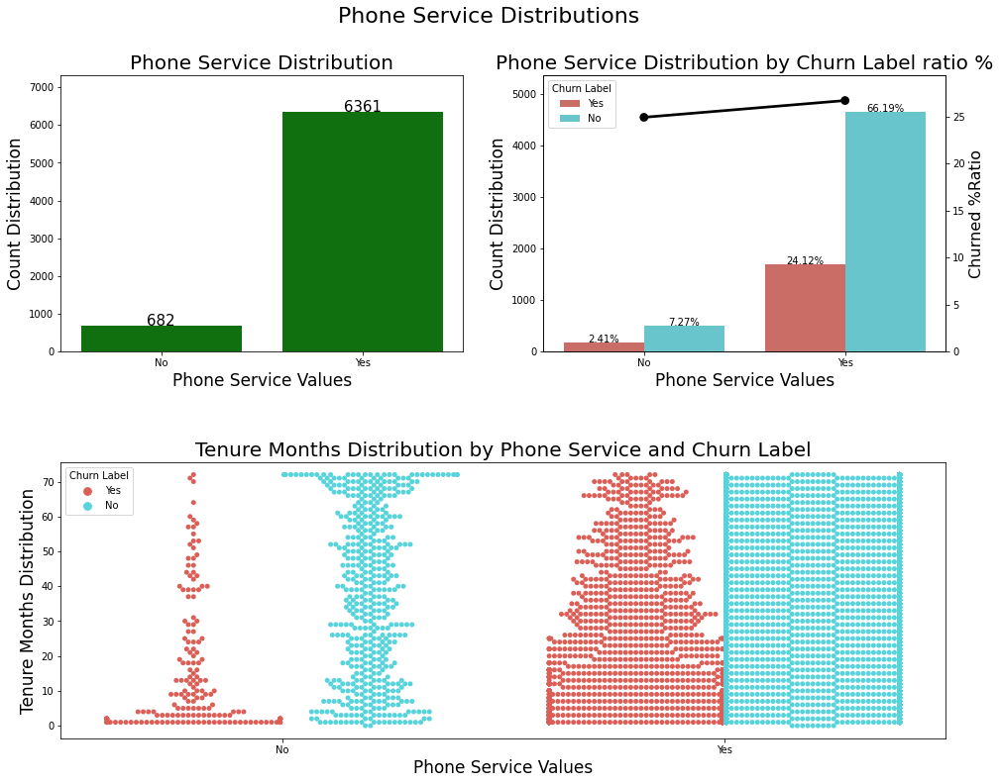

In [18]:
plot_categoricals(data, col="Phone Service", cont = "Tenure Months", binary="Churn Label", dodge=True)

No significant difference can be found regarding phone service binary value

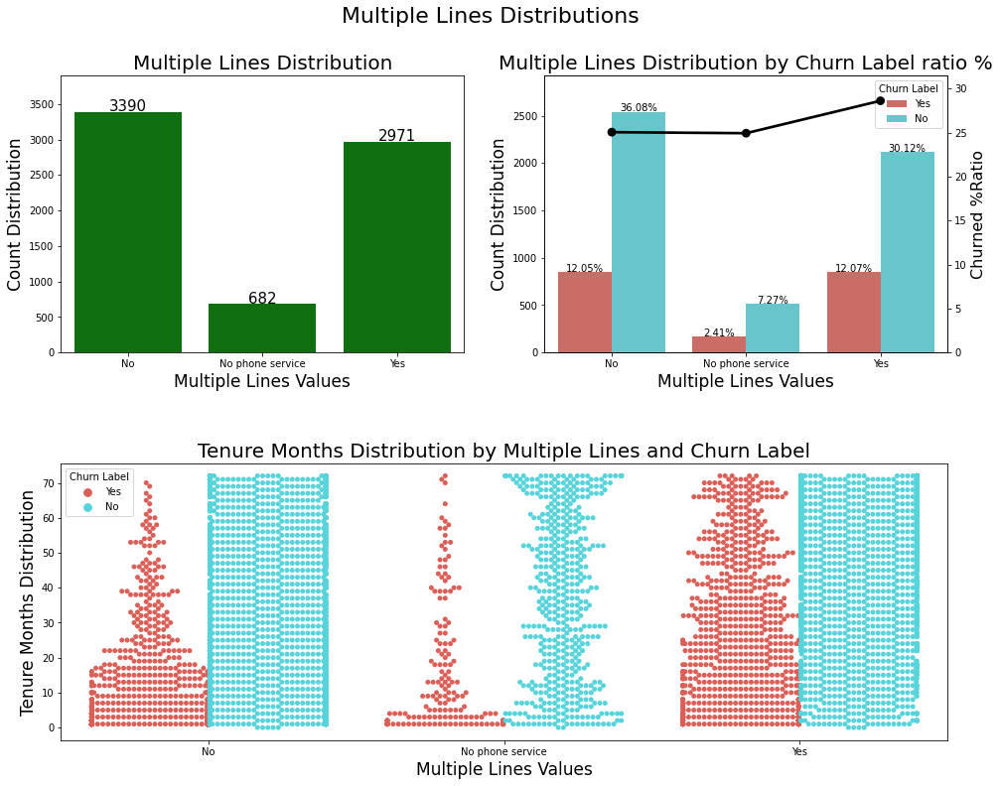

In [19]:
plot_categoricals(data, col="Multiple Lines", cont = "Tenure Months", binary="Churn Label", dodge=True)

There is a small difference between customers with multiple service lines and not multiple lines. But it seems that customers with multiple service lines are also older customers.

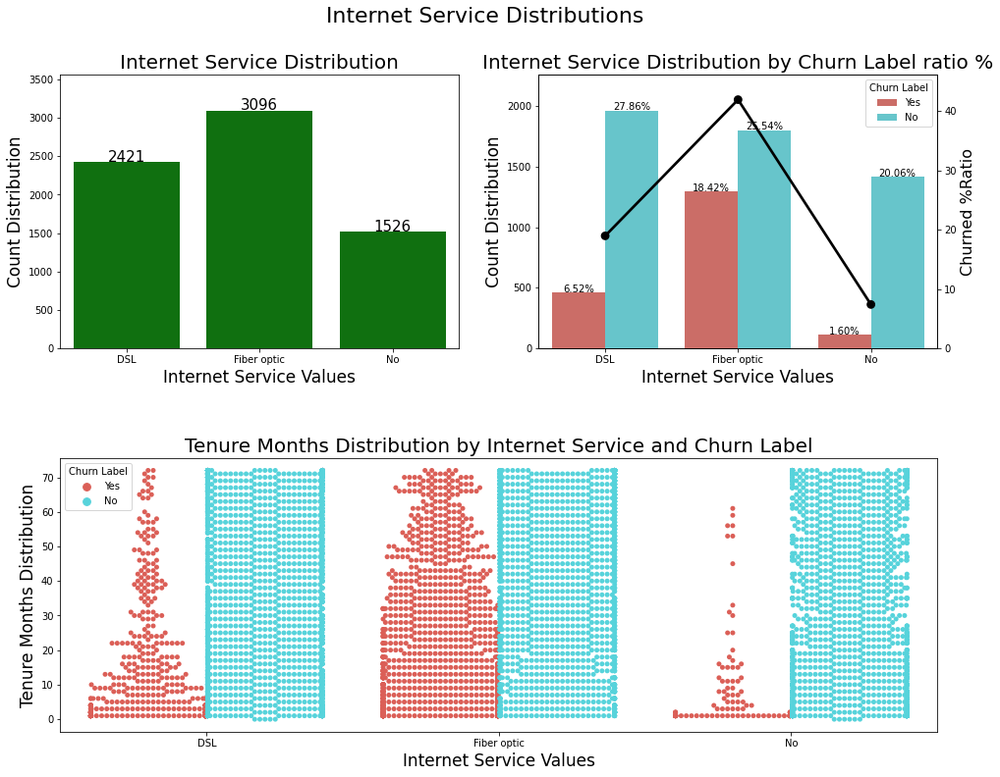

In [20]:
plot_categoricals(data, col="Internet Service", cont = "Tenure Months", binary="Churn Label", dodge=True)

Customers with __Fiber optic__ Internet Service have a significantly higher probability to churn compared to customers with __DSL__ or with no Internet Service at all.

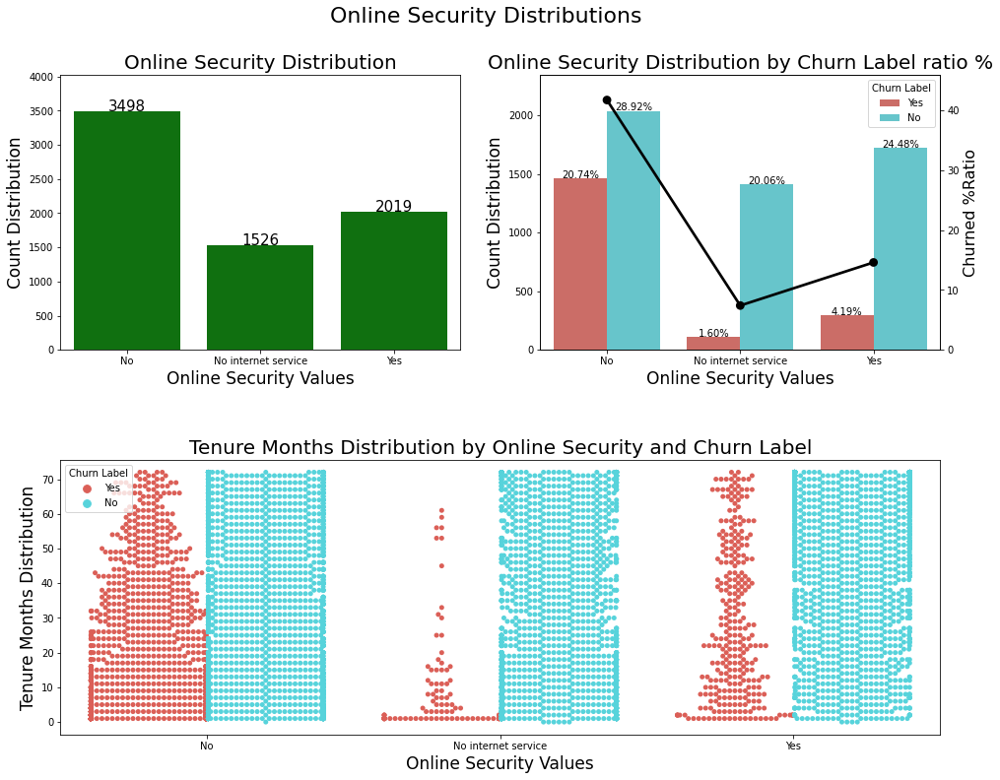

In [21]:
plot_categoricals(data, col="Online Security", cont = "Tenure Months", binary="Churn Label", dodge=True)

Customers with __No Online Security__ Internet Service have a significantly higher probability to churn compared to customers with __Online Security__ or with no Internet Service at all.

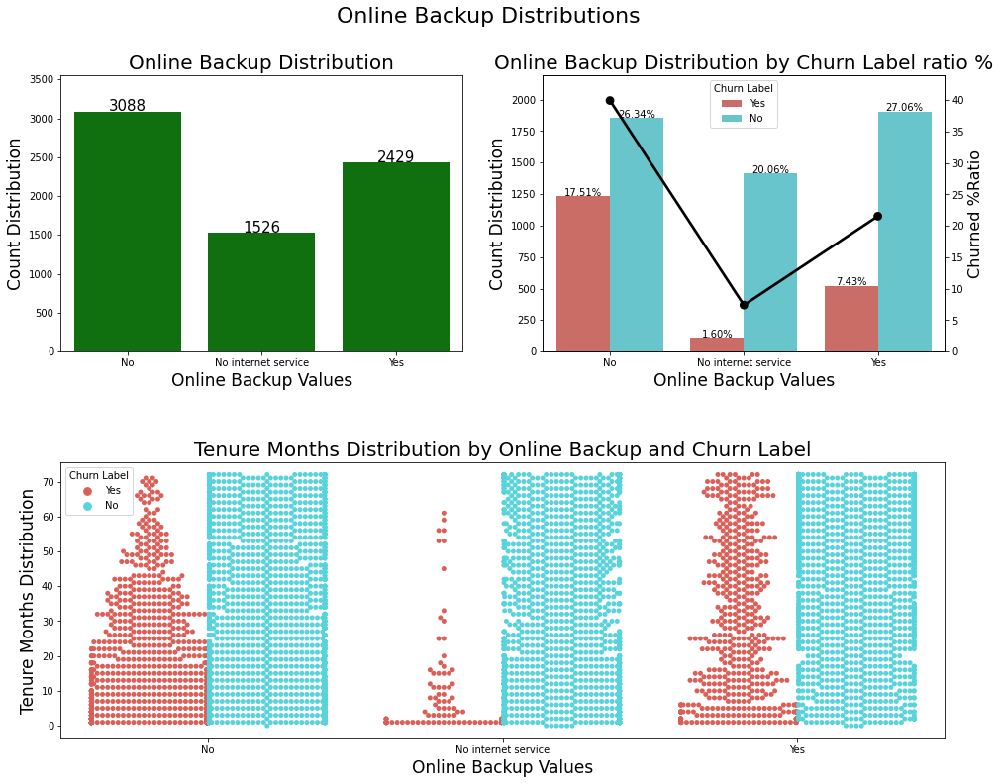

In [22]:
plot_categoricals(data, col="Online Backup", cont = "Tenure Months", binary="Churn Label", dodge=True)

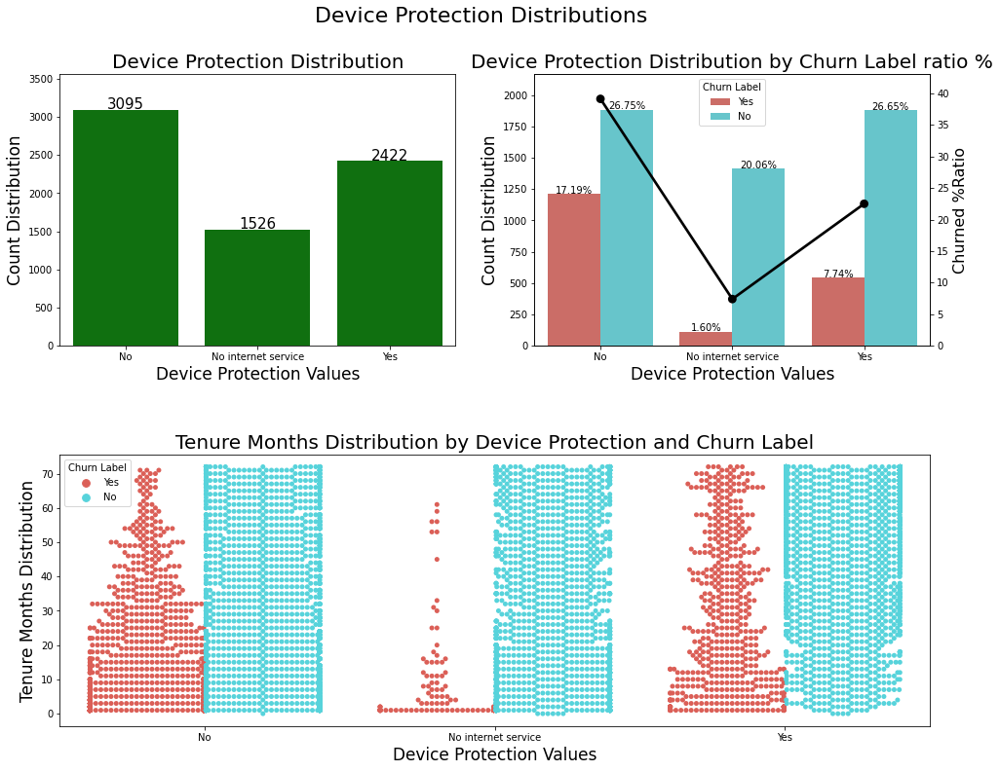

In [23]:
plot_categoricals(data, col="Device Protection", cont = "Tenure Months", binary="Churn Label", dodge=True)

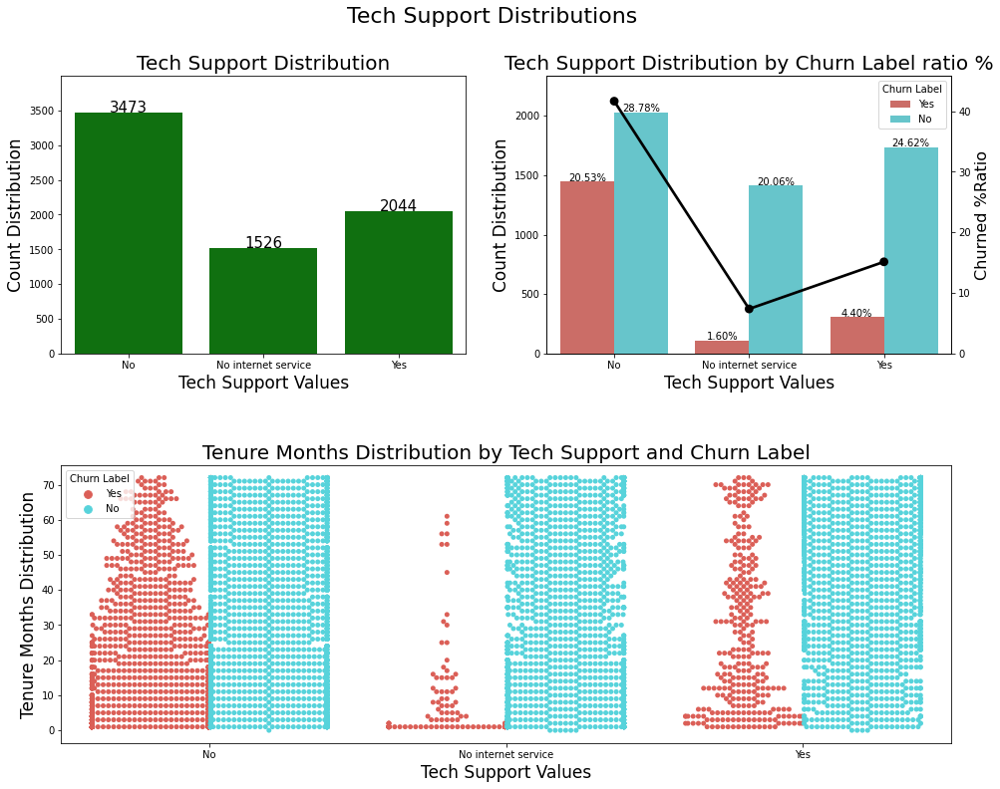

In [24]:
plot_categoricals(data, col="Tech Support", cont = "Tenure Months", binary="Churn Label", dodge=True)

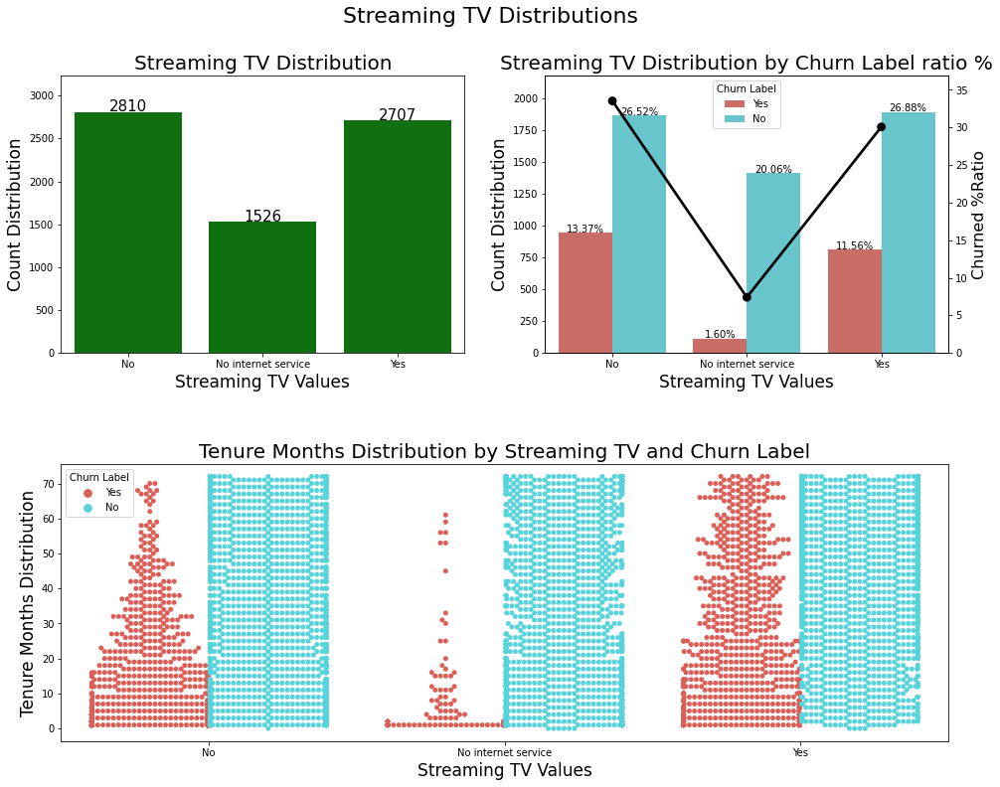

In [25]:
plot_categoricals(data, col="Streaming TV", cont = "Tenure Months", binary="Churn Label", dodge=True)

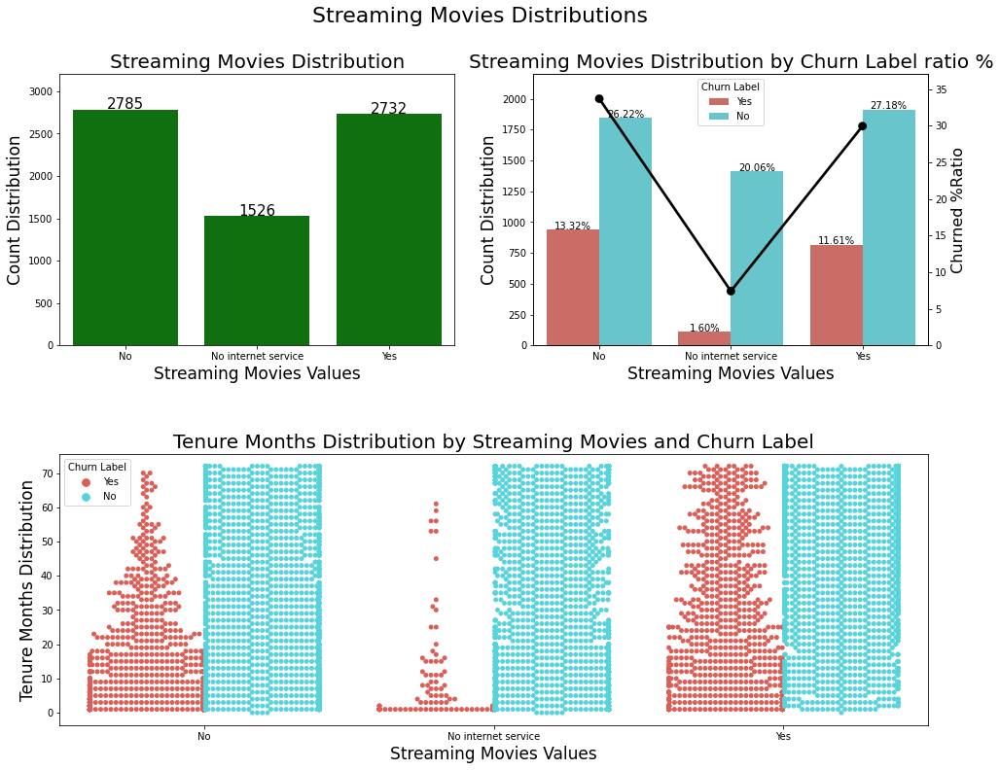

In [26]:
plot_categoricals(data, col="Streaming Movies", cont = "Tenure Months", binary="Churn Label", dodge=True)

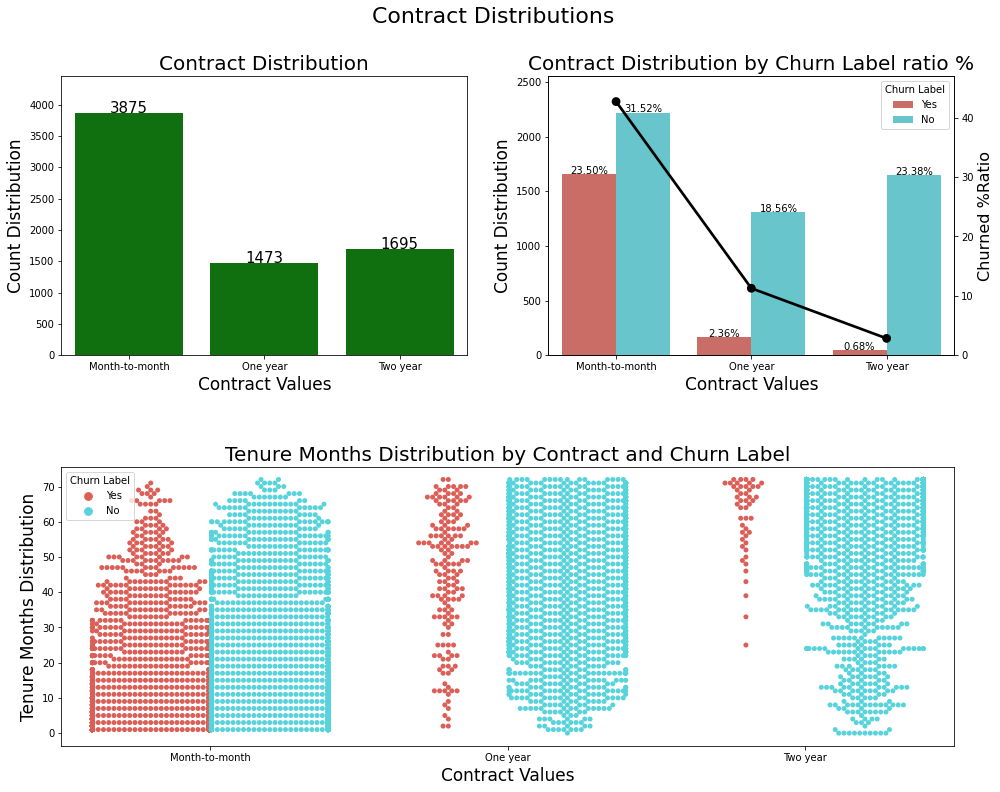

In [27]:
plot_categoricals(data, col="Contract", cont = "Tenure Months", binary="Churn Label", dodge=True)

- Customers with __month-to-month__ contract type are significantly more probable to churn compared to __1-year__ and __2-year__ contracts (42% -> 10% -> 3%)
- As expected __tenure__ is directly related with __contract type__ (The longest the duration of the contract the higher the overall tenure of the customer).

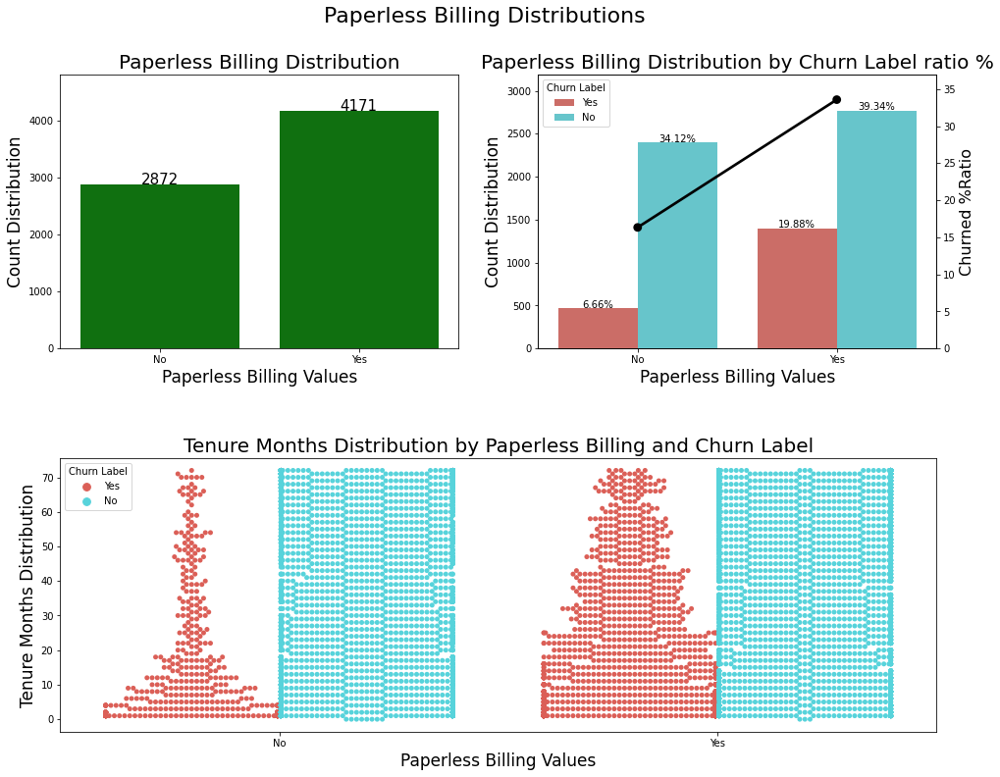

In [28]:
plot_categoricals(data, col="Paperless Billing", cont = "Tenure Months", binary="Churn Label", dodge=True)

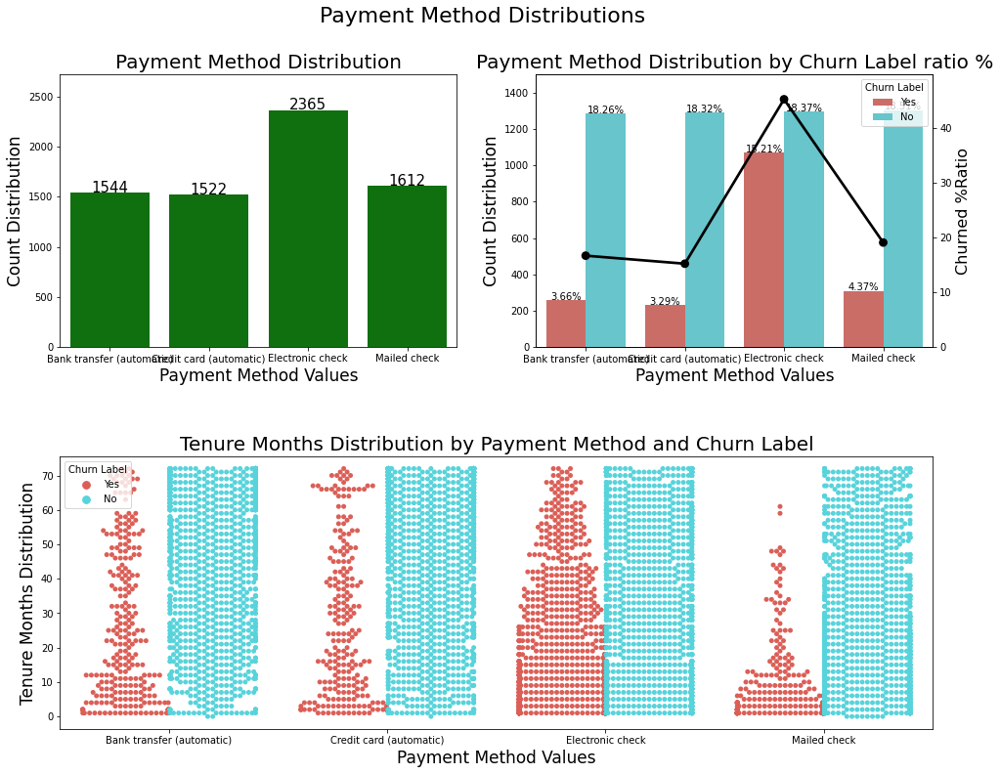

In [29]:
plot_categoricals(data, col="Payment Method", cont = "Tenure Months", binary="Churn Label", dodge=True)

### Plot Locations in a map

Below using __folium__ library very useful map every customer is represented based on their respective lat long coordinates. You can zoom in/out and check where most customers are located. Also a heatmap is applied where all the churners are located. You can get a good idea on which areas concentrate churners and get more immediate actions. Based on this idea at the feature engineering part of code distances are calculated for every customer from four major parts of California. This allows us to get advantage of the lat/long coordinates giving useful information.

In [30]:
PlotLocations(data)

### Mean Monthly Charges by Categorical Features

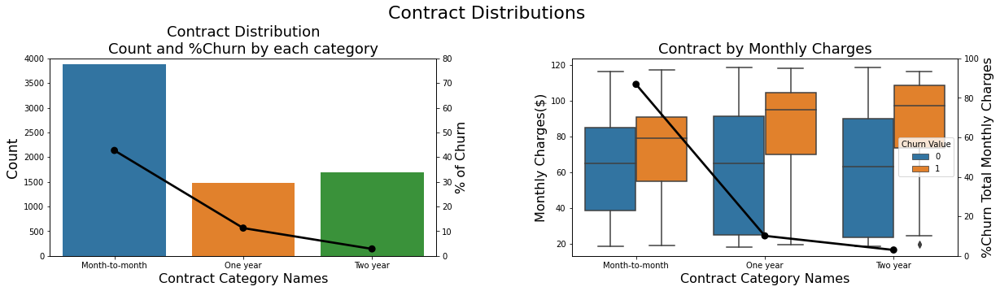

In [31]:
PlotDistRatio(data, 'Contract', lim=2500)

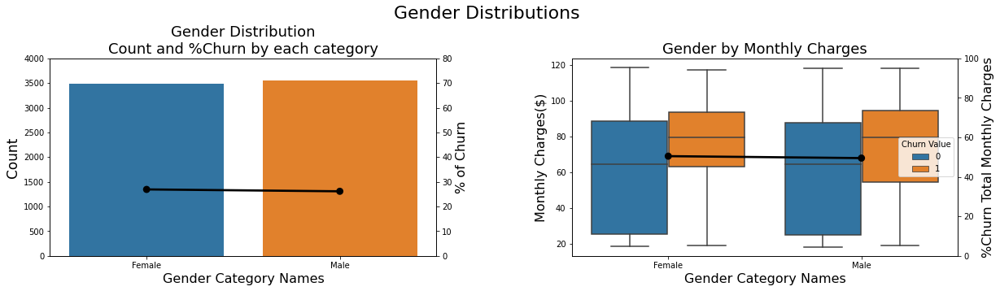

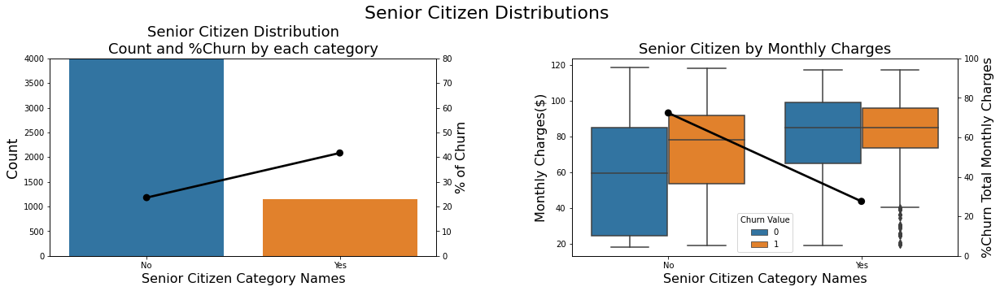

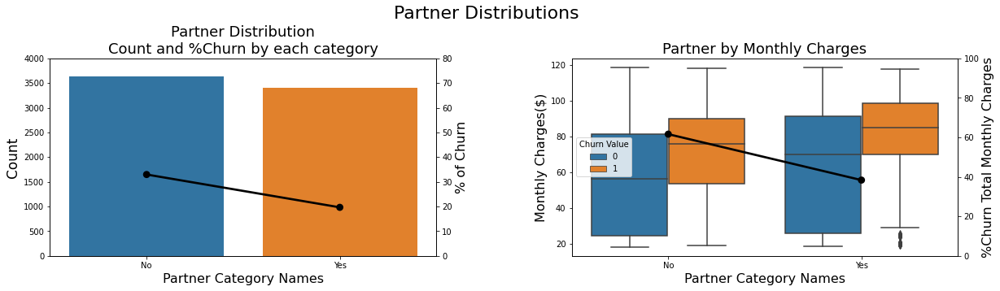

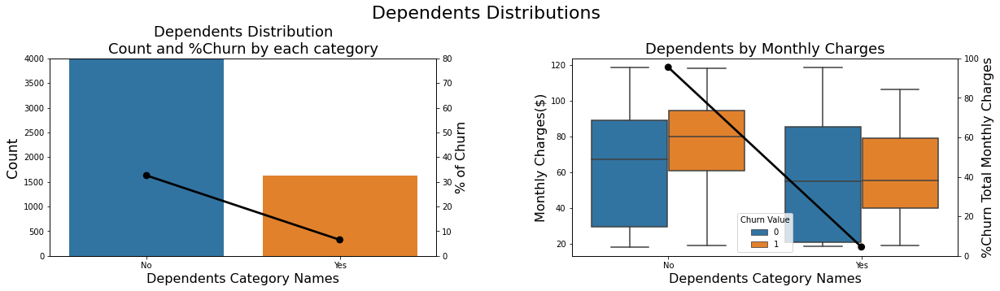

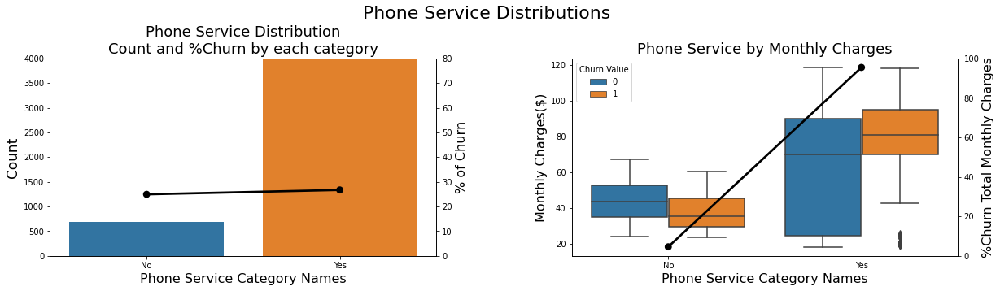

...

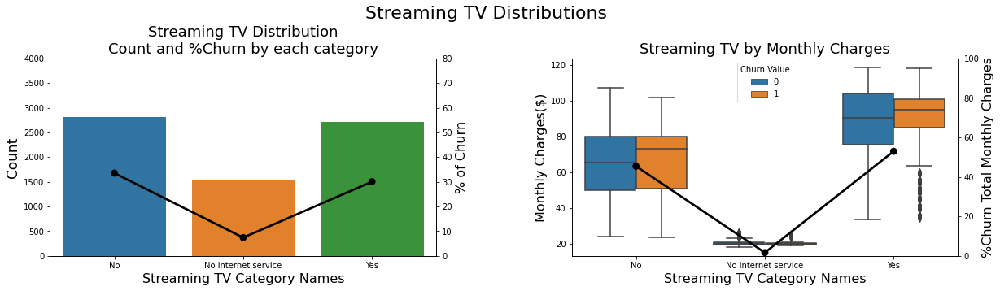

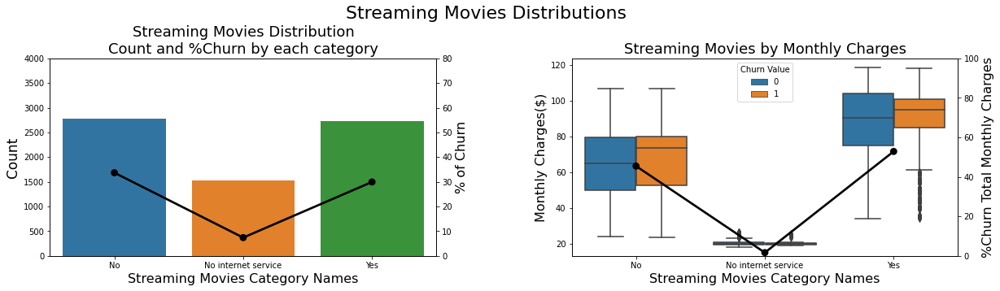

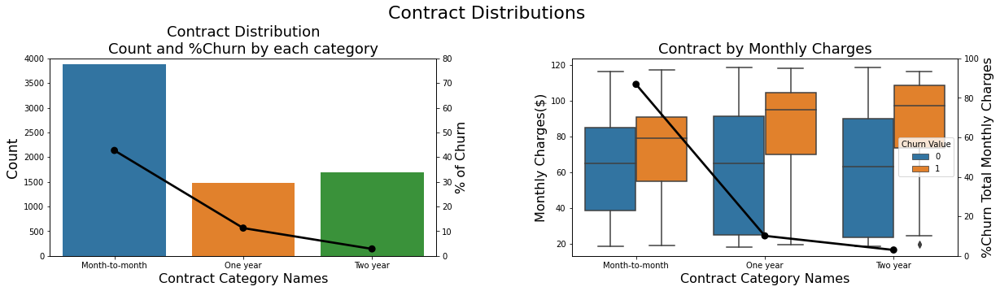

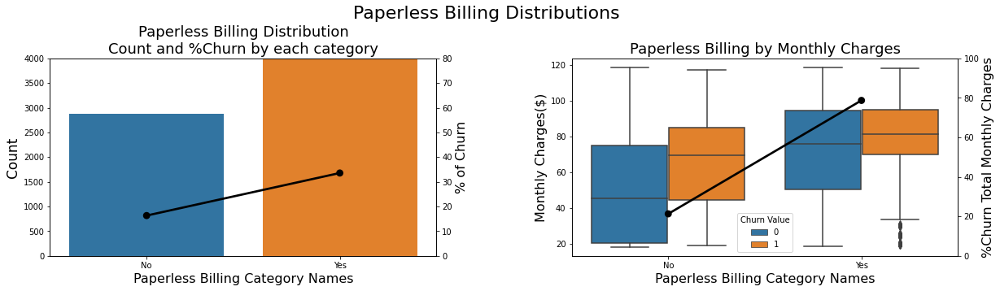

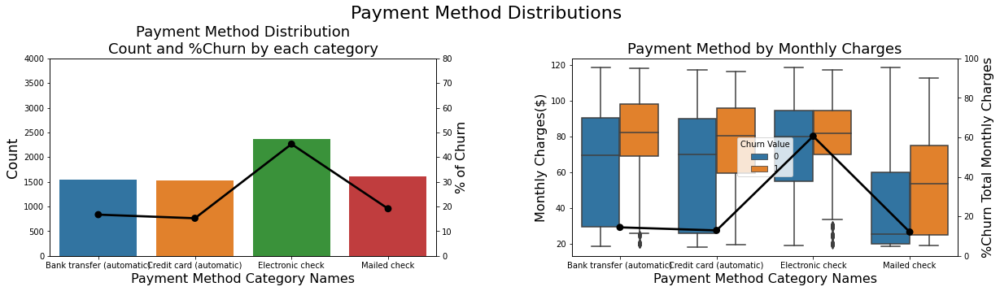

In [32]:
for col in ['Gender', 'Senior Citizen',
       'Partner', 'Dependents', 'Phone Service',
       'Multiple Lines', 'Internet Service', 'Online Security',
       'Online Backup', 'Device Protection', 'Tech Support', 'Streaming TV',
       'Streaming Movies', 'Contract', 'Paperless Billing', 'Payment Method']:

    PlotDistRatio(data, col, lim=2500)

### Clean - Transform Dataset

In [33]:
data_fe = FEngineering(data)

Data is transformed!
Data:  7043 observations, and  35 features


In [34]:
data_fe.head(10)

,CustomerID,Churn Value,Tenure Months,Monthly Charges,CLTV,Engaged,Male,No internet service ohe,Month-to-month ohe,One year ohe,Two year ohe,Mailed check ohe,Electronic check ohe,Bank transfer (automatic) ohe,Credit card (automatic) ohe,Fiber optic ohe,DSL ohe,No Protection,Total Services,san_francisco_distance,los_angeles_distance,san_diego_distance,sacramento_distance,Online Security,Online Backup,Device Protection,Tech Support,Streaming TV,Streaming Movies,Phone Service,Multiple Lines,Senior Citizen,Partner,Dependents,Paperless Billing
0,3668-QPYBK,1,2,53.85,3239,0,1,0,1,0,0,1,0,0,0,0,1,1,0,565.325792,10.135686,172.860054,587.137368,1,1,0,0,0,0,1,0,0,0,0,1
1,9237-HQITU,1,2,70.70,2701,0,0,0,1,0,0,0,1,0,0,1,0,1,0,555.234178,5.936155,183.248097,576.337767,0,0,0,0,0,0,1,0,0,0,1,1
2,9305-CDSKC,1,8,99.65,5372,0,0,0,1,0,0,0,1,0,0,1,0,1,0,556.992973,4.665020,181.506741,578.031199,0,0,1,0,1,1,1,1,0,0,1,1
3,7892-POOKP,1,28,104.80,5003,0,0,0,1,0,0,0,1,0,0,1,0,1,0,554.494874,6.739529,183.952959,575.693965,0,0,1,1,1,1,1,1,0,1,1,1
4,0280-XJGEX,1,49,103.70,5340,0,1,0,1,0,0,0,0,1,0,1,0,1,0,559.403314,2.537988,179.228076,580.115971,0,1,1,0,1,1,1,1,0,0,1,1
5,4190-MFLUW,1,10,55.20,5925,0,0,0,1,0,0,0,0,0,1,0,1,1,0,554.492161,6.308109,184.017465,575.539769,0,0,1,1,0,0,1,0,0,1,0,0
6,8779-QRDMV,1,1,39.65,5433,0,1,0,1,0,0,0,1,0,0,0,1,1,0,567.376125,8.639139,172.133172,586.557392,0,0,1,0,0,1,0,0,1,0,0,1
7,1066-JKSGK,1,1,20.15,4832,0,1,0,1,0,0,1,0,0,0,0,0,1,0,546.965910,17.775342,191.035925,570.061884,0,0,0,0,0,0,1,0,0,0,0,0
8,6467-CHFZW,1,47,99.35,5789,0,1,0,1,0,0,0,1,0,0,1,0,1,0,550.659611,9.318628,187.949679,571.527954,0,1,0,0,1,1,1,1,0,1,1,1
9,8665-UTDHZ,1,1,30.20,2915,0,1,0,1,0,0,0,1,0,0,0,1,1,0,553.431799,6.307888,185.345230,573.916875,0,1,0,0,0,0,0,0,0,1,0,0


### Check Correlation

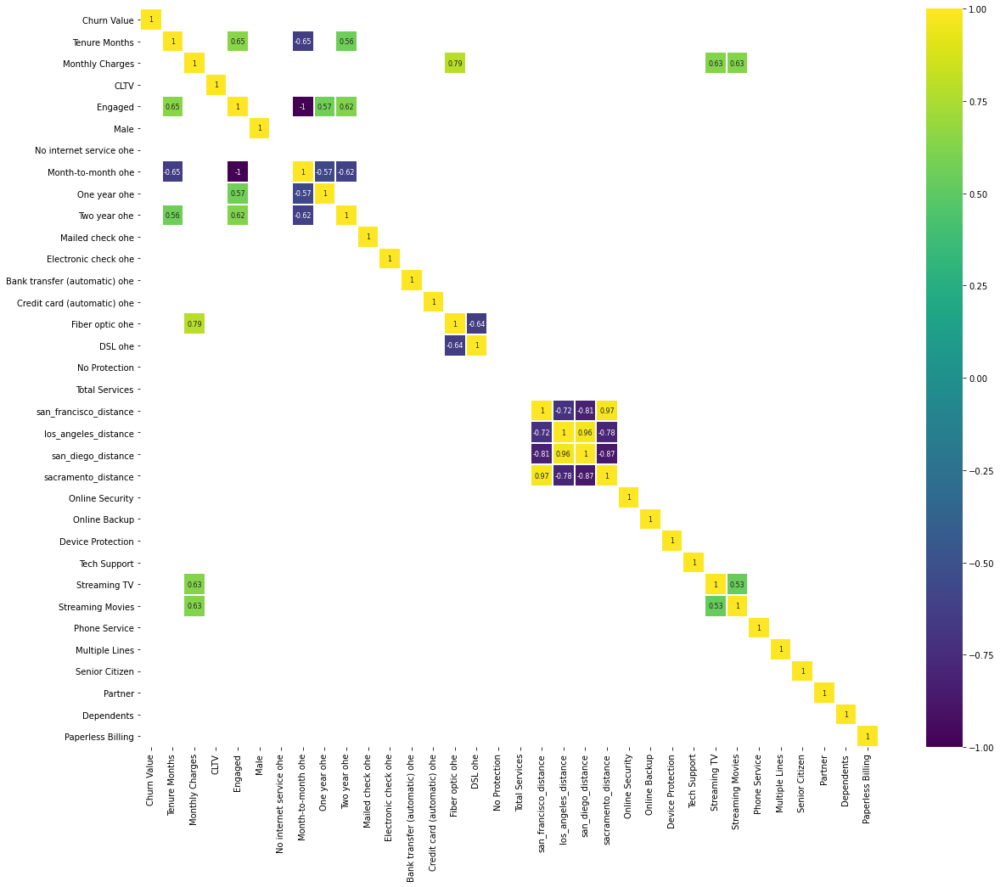

In [35]:
corr = data_fe.corr() # Examine correlations
plt.figure(figsize=(20, 16))

sns.heatmap(corr[(corr >= 0.5) | (corr <= -0.5)], 
            cmap='viridis', vmax=1.0, vmin=-1.0, linewidths=0.1,
            annot=True, annot_kws={"size": 8}, square=True);

### Churn Model Selection Process

- The best of models will be decided based on multiple performance metrics. 
- Then the best model will be optimized by choosing its best hyperparameters.
- Last, we will check performance metrics on optimized model and then we will check the best features which characterize the majority of decisions made and the subsequent probabilities for every customer.

#### ML Process

In [36]:
seed = 2
#Load data
data = LoadData(path,'Telco_customer_churn')
#Data Cleaning-Feature Engineering
data_fe = FEngineering(data)
#Variable Selection
prepared_data_best = variableselection(data_fe,21,'Churn Value',11,seed)
#keep those features only
feat_list= list(prepared_data_best.columns)
# Split train test
x_train, x_test, y_train, y_test = ModelCreation(data_fe,0.15,'Churn Value',feat_list,seed)

Data is loaded!
Data:  7043 observations, and  33 features
Data is transformed!
Data:  7043 observations, and  35 features
Remove Missing..
No internet service ohe
No Protection
Total Services
Pearson Correlation..
Chi-2..
11 selected features
RFE selector..
Fitting estimator with 30 features.
11 selected features
LogisticRegression l2 ..
8 selected features
Random Forest ..
12 selected features
Light GBM ..
12 selected features
['Two year ohe', 'Tenure Months', 'Dependents', 'Monthly Charges', 'Month-to-month ohe', 'Fiber optic ohe', 'Engaged', 'los_angeles_distance', 'Electronic check ohe', 'DSL ohe', 'san_diego_distance', 'Tech Support', 'Phone Service', 'Paperless Billing', 'Online Security', 'One year ohe', 'san_francisco_distance', 'sacramento_distance', 'Senior Citizen', 'Multiple Lines', 'Mailed check ohe']
Removed Columns {'sacramento_distance', 'Engaged', 'san_diego_distance'}
0.011957685152689615


Variables Selected are:

In [37]:
feat_list

['Two year ohe',
 'Tenure Months',
 'Dependents',
 'Monthly Charges',
 'Month-to-month ohe',
 'Fiber optic ohe',
 'los_angeles_distance',
 'Electronic check ohe',
 'DSL ohe',
 'Tech Support',
 'Phone Service',
 'Paperless Billing',
 'Online Security',
 'One year ohe',
 'san_francisco_distance',
 'Senior Citizen',
 'Multiple Lines',
 'Mailed check ohe']

LogReg: 0.607768 (+/- 0.014802)
XGBClassifier: 0.573545 (+/- 0.010771)
KNN: 0.535647 (+/- 0.020115)
DecisionTreeClassifier: 0.507924 (+/- 0.027890)
RandomForestClassifier: 0.568039 (+/- 0.011025)
GradientBoostingClassifier: 0.603607 (+/- 0.013057)
LGBMClassifier: 0.578833 (+/- 0.015147)
RidgeClassifier: 0.589197 (+/- 0.011947)
BaggingRidgeClassifier: 0.535747 (+/- 0.011759)
ExtraTreesClassifier: 0.547869 (+/- 0.019909)


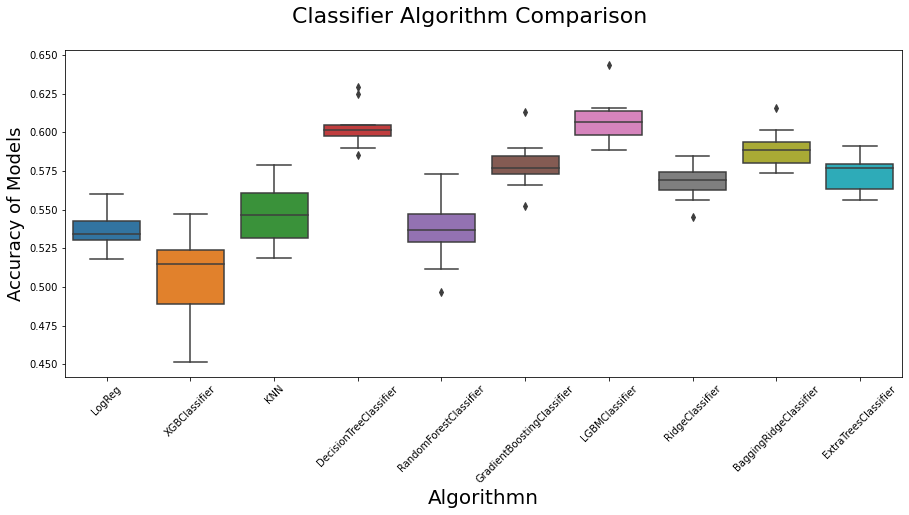

In [38]:

clfs = []


x_train, x_test, y_train, y_test = ModelCreation(data_fe,0.1,'Churn Value',feat_list,seed)

clfs.append(("LogReg",
             Pipeline([("Scaler", StandardScaler()),
                       ("LogReg", LogisticRegression())])))

clfs.append(("XGBClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("XGB", XGBClassifier())])))
clfs.append(("KNN",
             Pipeline([("Scaler", StandardScaler()),
                       ("KNN", KNeighborsClassifier())])))

clfs.append(("DecisionTreeClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("DecisionTrees", DecisionTreeClassifier())])))

clfs.append(("RandomForestClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("RandomForest", RandomForestClassifier())])))

clfs.append(("GradientBoostingClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("GradientBoosting",
                        GradientBoostingClassifier())])))
clfs.append(("LGBMClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("LGBMClassifier",
                        LGBMClassifier())])))

clfs.append(("RidgeClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("RidgeClassifier", RidgeClassifier())])))

clfs.append(("BaggingRidgeClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("BaggingClassifier", BaggingClassifier())])))

clfs.append(("ExtraTreesClassifier",
             Pipeline([("Scaler", StandardScaler()),
                       ("ExtraTrees", ExtraTreesClassifier())])))

#'neg_mean_absolute_error', 'neg_mean_squared_error','r2'
scoring = "f1"
n_folds = 10
test_size = 0.2

results, names = [], []

for name, model in clfs:
    kfold = StratifiedKFold(n_splits=n_folds, random_state=seed)
    cv = ShuffleSplit(n_splits=n_folds, test_size=test_size, random_state=seed)
    cv_results = cross_val_score(model,
                                 x_train,
                                 y_train,
                                 cv=cv,
                                 scoring=scoring,
                                 n_jobs=-1)
    names.append(name)
    results.append(cv_results)
    msg = "%s: %f (+/- %f)" % (name, cv_results.mean(), cv_results.std())
    print(msg)

# boxplot algorithm comparison
fig = plt.figure(figsize=(15, 6))
fig.suptitle('Classifier Algorithm Comparison', fontsize=22)
ax = fig.add_subplot(111)


foo = pd.DataFrame({'Names':names,'Results':results})
result = foo.explode('Results').reset_index(drop=True)
result = result.assign(Names=result['Names'].astype('category'), 
                       Values=result['Results'].astype(np.float32))

sns.boxplot(x='Names', y='Results', data=result)
ax.set_xticklabels(names)
ax.set_xlabel("Algorithmn", fontsize=20)
ax.set_ylabel("Accuracy of Models", fontsize=18)
ax.set_xticklabels(ax.get_xticklabels(), rotation=45)

plt.show()

[20:59:33] WARNING: ../src/learner.cc:1095: Starting in XGBoost 1.3.0, the default evaluation metric used with the objective 'binary:logistic' was changed from 'error' to 'logloss'. Explicitly set eval_metric if you'd like to restore the old behavior.


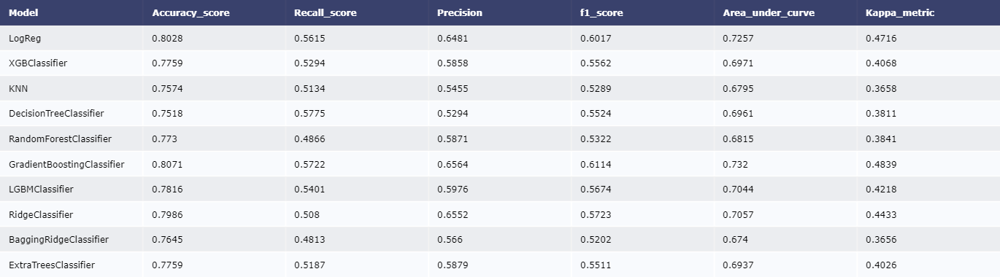

In [39]:
#gives model report in dataframe
def model_report(model,training_x,testing_x,training_y,testing_y,name) :
    model.fit(training_x,training_y)
    predictions  = model.predict(testing_x)
    accuracy     = accuracy_score(testing_y,predictions)
    recallscore  = recall_score(testing_y,predictions)
    precision    = precision_score(testing_y,predictions)
    roc_auc      = roc_auc_score(testing_y,predictions)
    f1score      = f1_score(testing_y,predictions) 
    kappa_metric = cohen_kappa_score(testing_y,predictions)
    
    df = pd.DataFrame({"Model"           : [name],
                       "Accuracy_score"  : [accuracy],
                       "Recall_score"    : [recallscore],
                       "Precision"       : [precision],
                       "f1_score"        : [f1score],
                       "Area_under_curve": [roc_auc],
                       "Kappa_metric"    : [kappa_metric],
                      })
    return df




results, names  = [], [] 

for name, model  in clfs:    
    names.append(name)
    model_results = model_report(model, x_train, x_test, y_train, y_test,name)
     #concat all models
    results.append(model_results)
    
    
model_performances = pd.concat(results)

table  = ff.create_table(np.round(model_performances,4))

py.iplot(table)

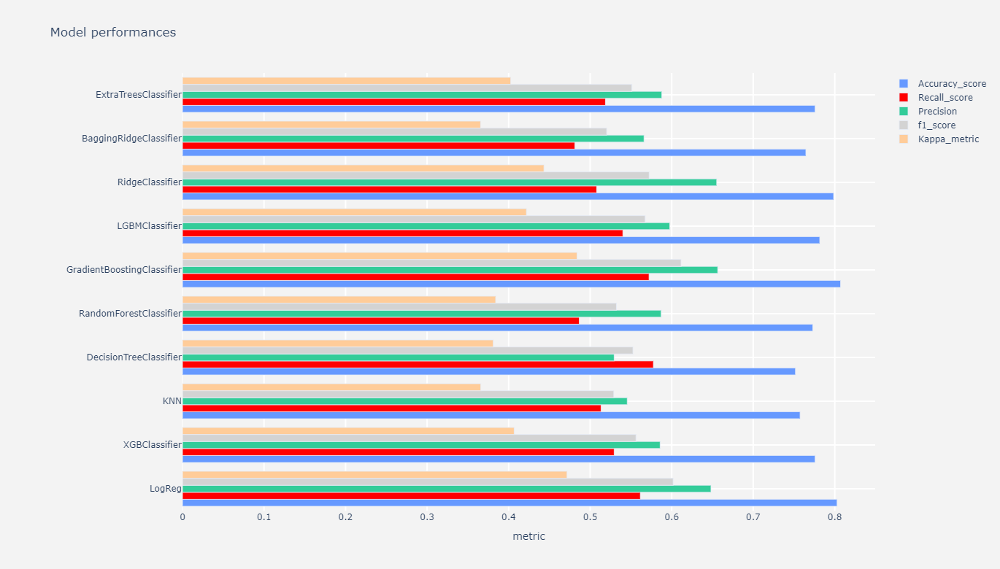

In [40]:
def output_tracer(metric,color) :
    tracer = go.Bar(y = model_performances["Model"] ,
                    x = model_performances[metric],
                    orientation = "h",name = metric ,
                    marker = dict(line = dict(width =.7),
                                  color = color)
                   )
    return tracer

layout = go.Layout(dict(title = "Model performances",
                        plot_bgcolor  = "rgb(243,243,243)",
                        paper_bgcolor = "rgb(243,243,243)",
                        xaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     title = "metric",
                                     zerolinewidth=1,
                                     ticklen=5,gridwidth=2),
                        yaxis = dict(gridcolor = 'rgb(255, 255, 255)',
                                     zerolinewidth=1,ticklen=5,gridwidth=2),
                        margin = dict(l = 250),
                        height = 780
                       )
                  )


trace1  = output_tracer("Accuracy_score","#6699FF")
trace2  = output_tracer('Recall_score',"red")
trace3  = output_tracer('Precision',"#33CC99")
trace4  = output_tracer('f1_score',"lightgrey")
trace5  = output_tracer('Kappa_metric',"#FFCC99")

data = [trace1,trace2,trace3,trace4,trace5]
fig = go.Figure(data=data,layout=layout)
py.iplot(fig)

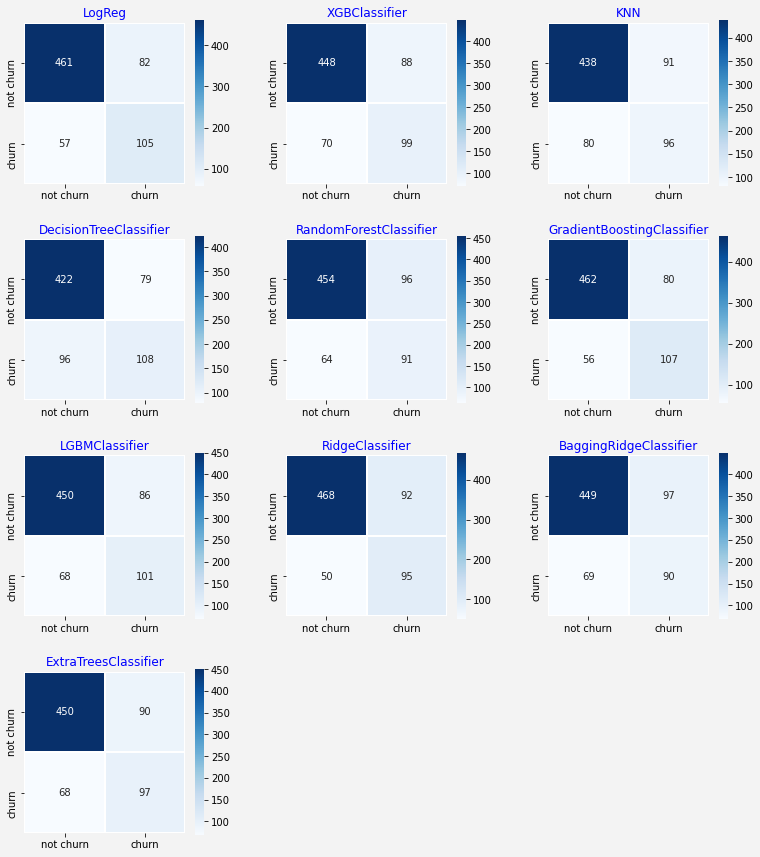

In [41]:
fig = plt.figure(figsize=(13,15))
fig.set_facecolor("#F3F3F3")
    
for i in range(len(clfs)):
    plt.subplot(4,3,(i + 1))
    predictions = clfs[i][1].predict(x_test)
    conf_matrix = confusion_matrix(predictions,y_test)
    sns.heatmap(conf_matrix,annot=True,fmt = "d",square = True,
                xticklabels=["not churn","churn"],
                yticklabels=["not churn","churn"],
                linewidths = 2,linecolor = "w",cmap = plt.cm.Blues)
    plt.title(clfs[i][0],color = "b")
    plt.subplots_adjust(wspace = .3,hspace = .3)

### Optimize Tuning for LightGBM model

In order to ensure that we produced the best possible version of lightgbm and have the fit that minimizes the residuals we need to search over the hyperparameter space and find those minima which accomplish this goal.

In [42]:
# Define searched space
hyper_space = {'objective': 'binary',
               'metric':'f1',
               'boosting':'gbdt', 
               'n_estimators': hp.choice('n_estimators', [25, 40, 50, 75, 100, 250, 500]),
               'scale_pos_weight': hp.choice('scale_pos_weight', [3, 5, 8, 13, 16]),
               'max_depth':  hp.choice('max_depth', list(range(6, 18, 2))),
               'num_leaves': hp.choice('num_leaves', list(range(20, 180, 20))),
               'subsample': hp.choice('subsample', [.7, .8, .9, 1]),
               'colsample_bytree': hp.uniform('colsample_bytree', 0.7, 1),
               'learning_rate': hp.uniform('learning_rate', 0.03, 0.12),
               'reg_alpha': hp.choice('reg_alpha', [.1, .2, .3, .4, .5, .6]),
               'reg_lambda':  hp.choice('reg_lambda', [.1, .2, .3, .4, .5, .6]),               
               'min_child_samples': hp.choice('min_child_samples', [20, 45, 70, 100])}

In [43]:
def to_minimize(hyperparameters, features, target):
    # create an instance of the model 
    clf = LGBMClassifier(**hyperparameters)
    # train with cross-validation
    result = cross_val_score(estimator = clf, 
                                X = features, 
                                y = target, 
                                scoring = "f1",
                                cv = cv, 
                                n_jobs = -1,
                                error_score='raise')
    
    return -result.mean()

In [46]:
%%time
from functools import partial
## run optimization
optimization = fmin(fn = partial(to_minimize, features = x_train, target = y_train),
                  space = hyper_space, 
                  algo = tpe.suggest,
                  trials = Trials(),
                  max_evals = int(60), 
                  rstate = np.random.RandomState(42))

100%|██████████| 60/60 [00:58<00:00,  1.02trial/s, best loss: -0.6443439139080342]
CPU times: user 6.24 s, sys: 466 ms, total: 6.71 s
Wall time: 58.8 s


In [47]:
# Print best parameters
from hyperopt import fmin, hp, tpe, Trials, space_eval, STATUS_OK, STATUS_RUNNING
best_params = space_eval(hyper_space, optimization)
best_params

{'boosting': 'gbdt',
 'colsample_bytree': 0.7071281222597764,
 'learning_rate': 0.05469872104252686,
 'max_depth': 6,
 'metric': 'f1',
 'min_child_samples': 70,
 'n_estimators': 25,
 'num_leaves': 120,
 'objective': 'binary',
 'reg_alpha': 0.2,
 'reg_lambda': 0.3,
 'scale_pos_weight': 3,
 'subsample': 0.7}

In [48]:
clf_best = LGBMClassifier(**best_params)
clf_best.fit(x_train, y_train)

[LightGBM] [Warning] boosting is set=gbdt, boosting_type=gbdt will be ignored. Current value: boosting=gbdt


LGBMClassifier(boosting='gbdt', colsample_bytree=0.7071281222597764,
               learning_rate=0.05469872104252686, max_depth=6, metric='f1',
               min_child_samples=70, n_estimators=25, num_leaves=120,
               objective='binary', reg_alpha=0.2, reg_lambda=0.3,
               scale_pos_weight=3, subsample=0.7)

### Check metrics and assess fit

accuracy is: 0.8049857999368886


confusion matrix is: [[3758  898]
 [ 338 1344]]


fbeta is: 0.7491638795986623


              precision    recall  f1-score   support

           0       0.92      0.81      0.86      4656
           1       0.60      0.80      0.69      1682

    accuracy                           0.80      6338
   macro avg       0.76      0.80      0.77      6338
weighted avg       0.83      0.80      0.81      6338



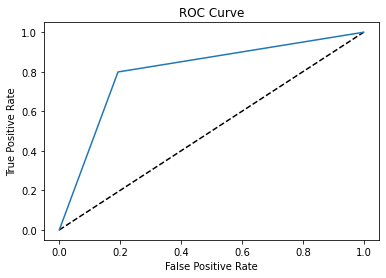

Confusion matrix, without normalization
[[3758  898]
 [ 338 1344]]
Normalized confusion matrix
[[0.80713058 0.19286942]
 [0.20095125 0.79904875]]


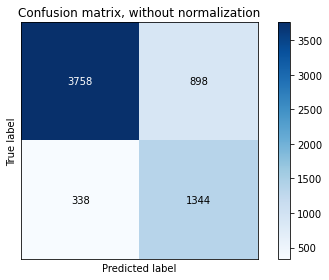

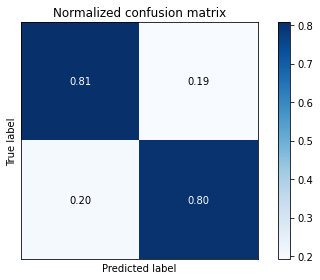

In [49]:
plotscoreclf(x_train, y_train,clf_best)

accuracy is: 0.7858156028368795


confusion matrix is: [[408 110]
 [ 41 146]]


fbeta is: 0.7270916334661355


              precision    recall  f1-score   support

           0       0.91      0.79      0.84       518
           1       0.57      0.78      0.66       187

    accuracy                           0.79       705
   macro avg       0.74      0.78      0.75       705
weighted avg       0.82      0.79      0.79       705



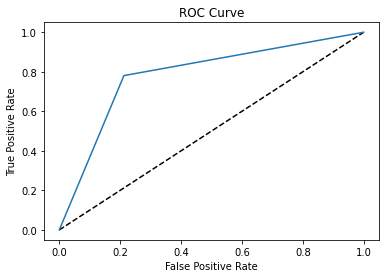

Confusion matrix, without normalization
[[408 110]
 [ 41 146]]
Normalized confusion matrix
[[0.78764479 0.21235521]
 [0.21925134 0.78074866]]


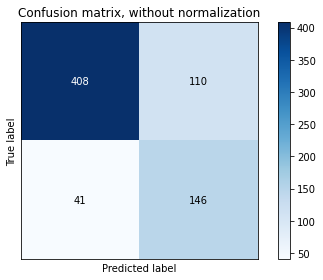

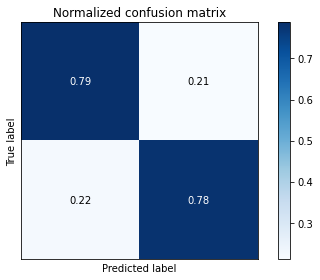

In [50]:
plotscoreclf(x_test, y_test,clf_best)

### Explain Machine Learning Model

#### Feature Importance

In [51]:
%time shap_values = shap.TreeExplainer(clf_best).shap_values(x_test)

CPU times: user 395 ms, sys: 1.97 ms, total: 397 ms
Wall time: 162 ms


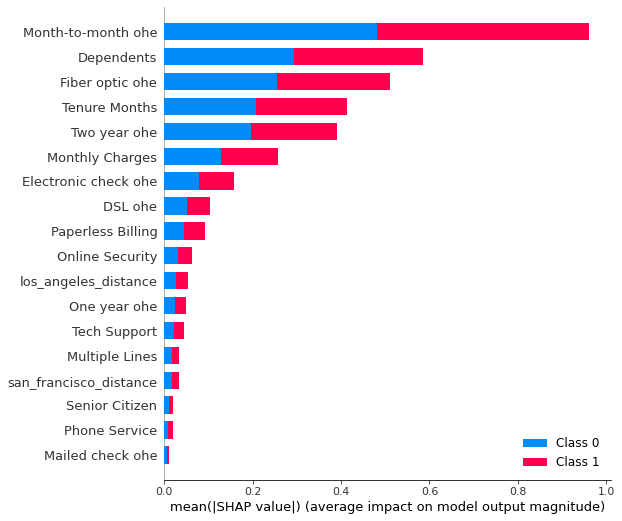

In [53]:
shap.summary_plot(shap_values, x_test)

In [54]:
explainer = shap.TreeExplainer(clf_best)
shap.force_plot(explainer.expected_value[0], shap_values[1][1,:], x_test.iloc[1,:])

Here for every customer in the test unseen dataset you can check why and how he got the churn label and probability

### Next Steps

1. Feature Engineering. It is always worthwhile to spend more time into finding new ways for new features and exploring new techniques like PCA or different encoding techniques for the categorical variables.
2. Model Tuning. In this particural notebook only LightGBM has been tuned further. This needs to be done foe every candidate model and then chose the best one.
3. Ensembling. Use ensembling techiques like averaging or voting or even stacking them using every candidate model. This would probably result into a better model.